# Анализ оттока клиентов в банке «Метанпромбанк»

**Описание проекта :**

Заказчик — менеджер из отдела маркетинга. 

Банк заинтересован в удержании уже имеющихся клиентов, а не в привлечении новых.

Как конечный итог, нам требуется создать дашборд, которым будут пользоваться в отделе маркетинга, и дать примеры мероприятий, которые можно провести, чтобы вернуть клиентов в банк или удержать сомневающихся от оттока. Дополнительно оформить результаты исследования в виде презентации.

Предварительно требуется проанализировать данные и найти закономерности

**Описание датасета :**

Банк располагается в Ярославле и областных городах: Ростов Великий и Рыбинск.

Колонки:

- `userid` — идентификатор пользователя,
- `score` — баллы кредитного скоринга,
- `City` — город,
- `Gender` — пол,
- `Age` — возраст,
- `equity`  — количество баллов собственности
- `Balance` — баланс на счёте,
- `Products` — количество продуктов, которыми пользуется клиент,
- `CreditCard` — есть ли кредитная карта,
- `last_activity` — активный клиент,
- `est_salary` — заработная плата клиента,
- `Churn` — ушёл или нет.


**Задача :**

Проанализируйте клиентов регионального банка и выделите сегменты клиентов, которые склонны уходить из банка.

- Проведите исследовательский анализ данных,
- Выделите портреты клиентов, которые склонны уходить из банка,
- Сформулируйте и проверьте статистические гипотезы.
    


## Изучение файла и подготовка данных

Импортируем библиотеки и оценим сырые данные

In [1]:
#импорт библиотек
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats as st
import numpy as np
from plotly import graph_objects as go
import warnings
warnings.filterwarnings("ignore") 
  
# добавляла еще в импорт ниже, выделила отдельно    

In [2]:
%%capture
!pip install missingno
!pip install ydata-profiling

import missingno as msno
import pandas as pd
from ydata_profiling import ProfileReport

In [3]:
#чтение фала
path = "https://drive.google.com/uc?export=download&id=1-U61mhTz_N1ARjy2XSAZ7IlQqGjeqP0F" 
df = pd.read_csv(path)
df1 = pd.read_csv(path)

In [4]:
#соберем первичную информацию о файле
print('---------------Первые 5 строк-------------------------------------------------')
display(df.head())
print('---------------Инфо о файле---------------------------------------------------')
display(df.info())
print('---------------Описание файла-------------------------------------------------')
display(df.describe())
print('---------------Пустые значения------------------------------------------------')
display(df.isna().sum())
print('---------------Полные дубли в данных------------------------------------------')
display(df.duplicated().sum())

---------------Первые 5 строк-------------------------------------------------


,USERID,score,city,gender,age,equity,balance,products,credit_card,last_activity,EST_SALARY,churn
0,183012,850.0,Рыбинск,Ж,25.0,1,59214.82,2,0,1,75719.14,1
1,146556,861.0,Рыбинск,Ж,37.0,5,850594.33,3,1,0,86621.77,0
2,120722,892.0,Рыбинск,Ж,30.0,0,NaN,1,1,1,107683.34,0
3,225363,866.0,Ярославль,Ж,51.0,5,1524746.26,2,0,1,174423.53,1
4,157978,730.0,Ярославль,М,34.0,5,174.00,1,1,0,67353.16,1


---------------Инфо о файле---------------------------------------------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 12 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   USERID         10000 non-null  int64  
 1   score          10000 non-null  float64
 2   city           10000 non-null  object 
 3   gender         10000 non-null  object 
 4   age            9974 non-null   float64
 5   equity         10000 non-null  int64  
 6   balance        7705 non-null   float64
 7   products       10000 non-null  int64  
 8   credit_card    10000 non-null  int64  
 9   last_activity  10000 non-null  int64  
 10  EST_SALARY     10000 non-null  float64
 11  churn          10000 non-null  int64  
dtypes: float64(4), int64(6), object(2)
memory usage: 937.6+ KB


None

---------------Описание файла-------------------------------------------------


,USERID,score,age,equity,balance,products,credit_card,last_activity,EST_SALARY,churn
count,10000.00000,10000.000000,9974.000000,10000.000000,7.705000e+03,10000.000000,10000.000000,10000.000000,1.000000e+04,10000.000000
mean,171814.71260,848.699400,42.734409,2.627600,8.277943e+05,1.870100,0.680400,0.523500,1.478669e+05,0.182000
std,33708.23812,65.448519,12.179971,1.980836,1.980614e+06,0.792647,0.466345,0.499472,1.393885e+05,0.385864
min,94561.00000,642.000000,18.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,2.546300e+03,0.000000
25%,142810.25000,802.000000,33.000000,0.000000,2.955542e+05,1.000000,0.000000,0.000000,7.525190e+04,0.000000
50%,172728.00000,853.000000,40.000000,3.000000,5.242722e+05,2.000000,1.000000,1.000000,1.196581e+05,0.000000
75%,201261.75000,900.000000,51.000000,4.000000,9.807058e+05,2.000000,1.000000,1.000000,1.745005e+05,0.000000
max,229145.00000,1000.000000,86.000000,9.000000,1.191136e+08,5.000000,1.000000,1.000000,1.395064e+06,1.000000


---------------Пустые значения------------------------------------------------


USERID              0
score               0
city                0
gender              0
age                26
equity              0
balance          2295
products            0
credit_card         0
last_activity       0
EST_SALARY          0
churn               0
dtype: int64

---------------Полные дубли в данных------------------------------------------


0

Видим, что:
- можно поправить названия колонок
- для score и age можно сменить тип колонок
- есть пропуски для age и balance          
- полных дуюлей нет

## Предобработка данных

Внесем изменения и посмотрим, есть ли какие-то аномалии или закономерности(например в пропусках)

In [5]:
#изменяем названия полей и тип данных
df.rename(columns = {'USERID':'user_id', 'EST_SALARY':'est_salary'}, inplace = True)

df1.rename(columns = {'USERID':'user_id', 'EST_SALARY':'est_salary'}, inplace = True)

display(df.head(1))

df['score'] = df['score'].astype('int')
print(df.info())

,user_id,score,city,gender,age,equity,balance,products,credit_card,last_activity,est_salary,churn
0,183012,850.0,Рыбинск,Ж,25.0,1,59214.82,2,0,1,75719.14,1


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 12 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   user_id        10000 non-null  int64  
 1   score          10000 non-null  int64  
 2   city           10000 non-null  object 
 3   gender         10000 non-null  object 
 4   age            9974 non-null   float64
 5   equity         10000 non-null  int64  
 6   balance        7705 non-null   float64
 7   products       10000 non-null  int64  
 8   credit_card    10000 non-null  int64  
 9   last_activity  10000 non-null  int64  
 10  est_salary     10000 non-null  float64
 11  churn          10000 non-null  int64  
dtypes: float64(3), int64(7), object(2)
memory usage: 937.6+ KB
None


Тип для age изменим чуть позже, когда будем анализировать этот столбец

In [6]:
ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### user_id

Выведем отдельно задублированные айдишники

In [7]:
# подсчет айдишников
vals = df['user_id'].value_counts()
vals = vals[vals > 1]
vals.columns = ['user_id', 'count']
vals.head()

227795    2
198635    2
210898    2
210627    2
202983    2
Name: user_id, dtype: int64

In [8]:
#смотрим на сами дублированные записи
df_id = df[df.duplicated(['user_id'])]
df_id_sorted=df_id.sort_values('user_id')
display(df_id)

,user_id,score,city,gender,age,equity,balance,products,credit_card,last_activity,est_salary,churn
1583,190253,726,Ярославль,М,49.0,0,NaN,1,1,1,177700.78,0
1837,210662,896,Рыбинск,Ж,37.0,0,NaN,2,0,0,90916.04,0
2138,131419,739,Рыбинск,Ж,37.0,3,1307941.65,3,0,0,103867.47,0
2165,187635,692,Рыбинск,Ж,NaN,0,NaN,1,1,1,160368.82,0
2302,220816,934,Рыбинск,Ж,74.0,5,1294285.39,3,1,0,95606.80,0
...,...,...,...,...,...,...,...,...,...,...,...,...
9775,124450,758,Рыбинск,Ж,36.0,0,73574.07,2,0,1,79963.59,0
9785,168998,895,Рыбинск,М,44.0,0,282653.53,3,0,0,255296.47,0
9819,140934,832,Рыбинск,Ж,NaN,3,385763.16,2,0,1,59651.35,0
9880,217412,886,Ярославль,Ж,35.0,3,1026172.14,2,1,0,53099.16,0


In [9]:
### КОД РЕВЬЮЕРА
df[df.duplicated(subset=['user_id'],keep=False)].sort_values('user_id').head(6)

,user_id,score,city,gender,age,equity,balance,products,credit_card,last_activity,est_salary,churn
1893,116540,883,Рыбинск,Ж,55.0,1,362756.49,3,0,1,175920.48,1
7694,116540,887,Ярославль,Ж,38.0,0,NaN,1,0,1,119247.61,0
7542,117943,880,Ярославль,Ж,40.0,0,NaN,1,1,0,137718.93,0
4866,117943,855,Рыбинск,Ж,32.0,6,1036832.93,4,1,1,107792.71,1
5896,120258,905,Ярославль,М,30.0,0,NaN,1,1,1,146427.96,0
5863,120258,908,Рыбинск,Ж,38.0,4,2213581.63,2,0,1,160327.77,1


In [10]:
# рандомно выбираем некоторые из них для сравнения в датасете
display(df[df['user_id']== 190253])
display(df[df['user_id']== 210662])
display(df[df['user_id']== 131419])
display(df[df['user_id']== 187635])
display(df[df['user_id']== 220816])
display(df[df['user_id']== 124450])
display(df[df['user_id']== 168998])
display(df[df['user_id']== 217412])
display(df[df['user_id']== 175730])

,user_id,score,city,gender,age,equity,balance,products,credit_card,last_activity,est_salary,churn
231,190253,823,Рыбинск,М,37.0,4,373348.39,2,0,1,131947.92,1
1583,190253,726,Ярославль,М,49.0,0,NaN,1,1,1,177700.78,0


,user_id,score,city,gender,age,equity,balance,products,credit_card,last_activity,est_salary,churn
869,210662,962,Ярославль,Ж,54.0,5,5069231.39,1,1,1,955144.85,1
1837,210662,896,Рыбинск,Ж,37.0,0,NaN,2,0,0,90916.04,0


,user_id,score,city,gender,age,equity,balance,products,credit_card,last_activity,est_salary,churn
904,131419,934,Ярославль,М,35.0,5,2348335.95,2,0,0,217105.13,1
2138,131419,739,Рыбинск,Ж,37.0,3,1307941.65,3,0,0,103867.47,0


,user_id,score,city,gender,age,equity,balance,products,credit_card,last_activity,est_salary,churn
918,187635,918,Ярославль,Ж,44.0,0,NaN,1,1,1,162497.52,0
2165,187635,692,Рыбинск,Ж,NaN,0,NaN,1,1,1,160368.82,0


,user_id,score,city,gender,age,equity,balance,products,credit_card,last_activity,est_salary,churn
1740,220816,840,Ярославль,Ж,41.0,3,1193287.13,2,1,1,76434.94,1
2302,220816,934,Рыбинск,Ж,74.0,5,1294285.39,3,1,0,95606.80,0


,user_id,score,city,gender,age,equity,balance,products,credit_card,last_activity,est_salary,churn
8164,124450,859,Ярославль,Ж,38.0,6,516811.20,1,1,1,95144.63,1
9775,124450,758,Рыбинск,Ж,36.0,0,73574.07,2,0,1,79963.59,0


,user_id,score,city,gender,age,equity,balance,products,credit_card,last_activity,est_salary,churn
5020,168998,886,Ярославль,Ж,35.0,4,394780.61,2,1,1,510577.10,1
9785,168998,895,Рыбинск,М,44.0,0,282653.53,3,0,0,255296.47,0


,user_id,score,city,gender,age,equity,balance,products,credit_card,last_activity,est_salary,churn
7055,217412,879,Рыбинск,М,42.0,5,568140.15,3,0,0,231658.67,1
9880,217412,886,Ярославль,Ж,35.0,3,1026172.14,2,1,0,53099.16,0


,user_id,score,city,gender,age,equity,balance,products,credit_card,last_activity,est_salary,churn
7753,175730,846,Ярославль,Ж,32.0,7,216764.74,4,1,1,77100.85,1
9970,175730,816,Рыбинск,М,36.0,4,477892.07,3,1,0,81100.60,0


По user_id можно было бы предположить, что есть задублированные клиенты с разными id(например девушка сменила фамилию), однако мы не получаем одинаковые значения в других колонках. Тут можно предположить, что загрузка в эту витрину произошла с ошибкой. Для того, чтобы избегать такое, можно настроить загрузку на только уникальные id, либо если это касается смены данных клиента, то отслеживать по тому открыта ли запись или уже архивная(start_dt, end_dt). 


Варианты почему такие задубливания произошли:
- загрузка произошла с разных филиалов с наложением, а уникальность записей не настроена
- возможно есть архивные записи в датасете, которые попали в выгрузку без фильтра на end_dt

Возможно, это стоит подсветить для доработки витрины(коллегам с dwh или объяснить на примерах треш-записей бизнесу), иначе можно стабильно получать потерю данных

В любом случае сейчас надо убрать такие данные

In [11]:
#удаление дубликатов
df['user_id'].nunique()

df.duplicated(subset=['user_id']).sum()
print(len(df))
df = df.drop_duplicates(subset=['user_id'])
print(len(df))

10000
9927


### score

Text(0.5, 0, 'Баллы')

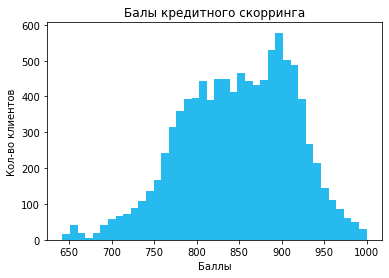

In [12]:
# график для score
df['score'].sort_values().plot(y = 'score', kind = 'hist', bins = 40, 
                                        range=(df['score'].min(),df['score'].max()), color="#26baee")
plt.title('Балы кредитного скорринга')
plt.ylabel('Кол-во клиентов')
plt.xlabel('Баллы')

<div class="alert alert-warning"><b>Комментарий ревьюера</b>&nbsp;⚠️<br>
Лучше подбирать число корзин так, чтобы график не шёл лесенкой.
</div>

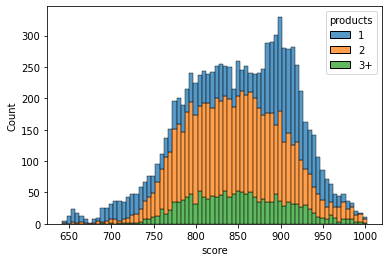

In [13]:
### КОД РЕВЬЮЕРА

sns.histplot(data=df.assign(products=df.products.clip(1,3).replace(3,'3+')),
             x='score',hue='products',multiple='stack',binwidth=5,
             hue_order=[1,2,'3+']);

Оставляем все данные без изменений

### city

In [14]:
# смотрим как распределены клиенты по городам
fig = go.Figure(data=[go.Pie(labels=['Ярославль', 'Рыбинск', 'Ростов'], values=df['city'].value_counts(), \
                             title='Распределение клиентов по городам')])
fig.show()

Для удобства дальнейшей работы с городами требуется трансформировать столбец city в три отдельных столбца по каждому городу. Флаг будет показывать в одном из столбцов к какой локации клиент относится 

### gender

In [15]:
df['gender'].value_counts()

М    4972
Ж    4955
Name: gender, dtype: int64

Разделение почти 50на50. Пока не будем менять на флаги, сделаем это, когда понадобится

### age

In [16]:
# смотрим пустые значения
display(df[df['age'].isna()])

,user_id,score,city,gender,age,equity,balance,products,credit_card,last_activity,est_salary,churn
1247,228075,932,Ярославль,М,NaN,5,7601719.20,2,1,1,408121.16,0
3091,138660,836,Ростов,Ж,NaN,5,294315.53,2,0,1,63310.22,1
4912,210674,834,Рыбинск,М,NaN,1,238330.52,2,0,1,93775.06,0
7345,184913,829,Ярославль,Ж,NaN,3,188648.77,2,0,1,75206.90,0


In [17]:
# удаляем их
df = df.loc[~(df['age'].isna())]
display(df[df['age'].isna()])

,user_id,score,city,gender,age,equity,balance,products,credit_card,last_activity,est_salary,churn


18.0

86.0

Text(0.5, 0, 'Возраст')

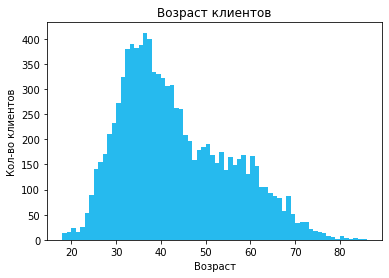

In [18]:
# посмотрим в каких возрастных границах у нас клиенты 
display(df['age'].min())
display(df['age'].max())

bins_c = (df['age'].max() - df['age'].min() + 1)

data = df['age']

# график для age
df['age'].sort_values().plot(y = 'age', kind = 'hist', bins = np.arange(min(data), max(data) + 1, 1), #100, 
                                        range=(df['age'].min(),df['age'].max()), color="#26baee")
plt.title('Возраст клиентов')
plt.ylabel('Кол-во клиентов')
plt.xlabel('Возраст')

Клиентами банка становятся в 18, что логично. Есть небольшая группа за 80, но не будем ее удалять, т.к у нас таких клиентов очень мало и они не повлияют

### equity

In [19]:
df['equity'].value_counts()

0    2554
5    1909
4    1841
3    1532
2    1046
1     771
6     161
7      79
8      17
9      13
Name: equity, dtype: int64

Оставим как есть

### balance

In [20]:
#мне удобнее видеть результат без экспоненты, а округлять я не стала
pd.options.display.float_format ='{:,.3f}'.format

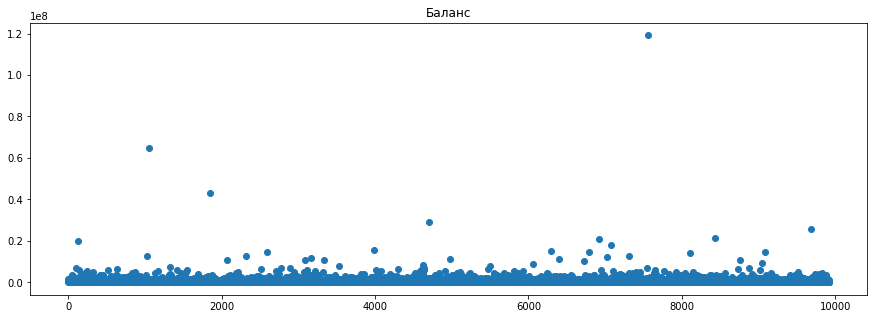

count         7,663.000
mean        828,248.160
std       1,984,247.693
min               0.000
25%         295,498.985
50%         524,961.220
75%         980,801.490
max     119,113,552.010
Name: balance, dtype: float64

In [21]:
#посмотрим как выглядит на графике
x_values = pd.Series(range(0,len(df['balance'])))
plt.figure(figsize=(15,5))
plt.title('Баланс')
plt.scatter(x_values, df['balance'])
plt.show()

df['balance'].describe()

Text(0.5, 0, 'Баланс')

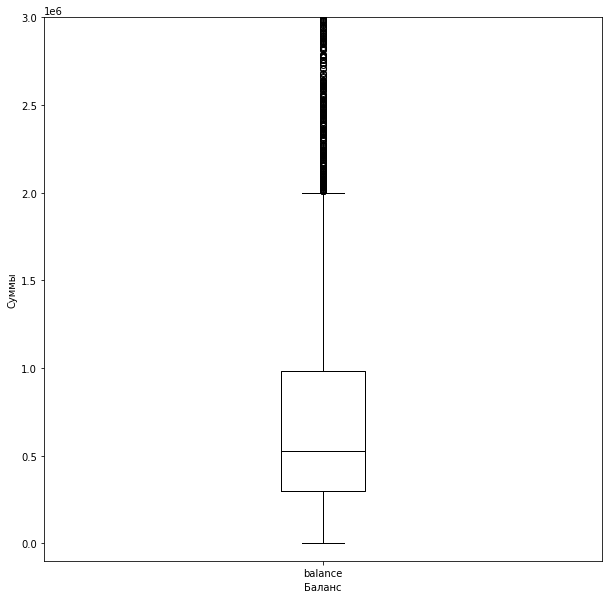

In [22]:
# Добавлено
plt.figure(figsize=(10, 10))
df.boxplot(column=['balance'], grid= False , color='black')
plt.ylim([-100000, 3000000])

plt.ylabel('Суммы')
plt.xlabel('Баланс')

Есть выбросы, но мы их оставим, т.к это VIP-клиенты

Посмотрим на пустые значения для balance

In [23]:
#скопируем датасет и поработаем с ним отдельно
df_balance = df[df['balance'].isna()]
df_balance

,user_id,score,city,gender,age,equity,balance,products,credit_card,last_activity,est_salary,churn
2,120722,892,Рыбинск,Ж,30.000,0,NaN,1,1,1,"107,683.340",0
9,133130,906,Ярославль,Ж,67.000,0,NaN,1,0,1,"238,055.530",0
10,148929,927,Ростов,М,52.000,0,NaN,1,1,1,"196,820.070",0
11,172184,921,Ростов,М,41.000,0,NaN,1,1,1,"217,469.480",0
19,127034,922,Рыбинск,Ж,53.000,0,NaN,1,0,0,"147,094.820",0
...,...,...,...,...,...,...,...,...,...,...,...,...
9976,208085,876,Ростов,М,38.000,0,NaN,1,0,0,"171,763.690",0
9984,125941,729,Ярославль,Ж,42.000,0,NaN,1,1,1,"687,538.700",0
9993,219924,884,Рыбинск,Ж,36.000,0,NaN,1,1,1,"169,844.880",0
9996,139170,894,Ярославль,М,46.000,0,NaN,1,1,0,"196,898.290",0


In [24]:
print('---------------Собственность-------------------------------------------------')
display(df_balance.groupby('equity')['user_id'].count())

---------------Собственность-------------------------------------------------


equity
0    2145
1     114
3       1
Name: user_id, dtype: int64

In [25]:
#запомним 0 пропуски и попробуем найти закономерности с другими столбцами
df_balance['balance'] = df_balance['balance'].fillna('0').astype('float')

df_balance = df_balance.query('balance == 0')

print('---------------Поиск закономерностей-------------------------------------------------')
print('---------------Город-------------------------------------------------')
display(df_balance.groupby('city')['user_id'].count())
print('---------------Пол-------------------------------------------------')
display(df_balance.groupby('gender')['user_id'].count())
#print('---------------Собственность-------------------------------------------------')
#display(df_balance.groupby('equity')['user_id'].count())
#print('---------------Возраст-------------------------------------------------')
#display(df_balance.groupby('age')['user_id'].count())
print('---------------Продукт-------------------------------------------------')
display(df_balance.groupby('products')['user_id'].count())
print('---------------Кредитка-------------------------------------------------')
display(df_balance.groupby('credit_card')['user_id'].count())
print('---------------Активность-------------------------------------------------')
display(df_balance.groupby('last_activity')['user_id'].count())
#print('---------------Зп-------------------------------------------------')
#display(df_balance.groupby('est_salary')['user_id'].count())
print('---------------Отток-------------------------------------------------')
display(df_balance.groupby('churn')['user_id'].count())

---------------Поиск закономерностей-------------------------------------------------
---------------Город-------------------------------------------------


city
Ростов        235
Рыбинск       576
Ярославль    1449
Name: user_id, dtype: int64

---------------Пол-------------------------------------------------


gender
Ж     997
М    1263
Name: user_id, dtype: int64

---------------Продукт-------------------------------------------------


products
0       1
1    1921
2     310
3      28
Name: user_id, dtype: int64

---------------Кредитка-------------------------------------------------


credit_card
0     417
1    1843
Name: user_id, dtype: int64

---------------Активность-------------------------------------------------


last_activity
0    1019
1    1241
Name: user_id, dtype: int64

---------------Отток-------------------------------------------------


churn
0    2247
1      13
Name: user_id, dtype: int64

Судя по отчету, у нас может быть зависимость с полем equity, однако только большая часть приходится на 0 в equity, а не все записи. Как и с городами, это просто может быть самая многочисленная группа. Кроме null-значений у нас есть и 0 значения, можем сделать вывод, что заполнить как 0 - будет некорректно, поэтому оставляем как есть данные. Пропуски относятся к MNAR

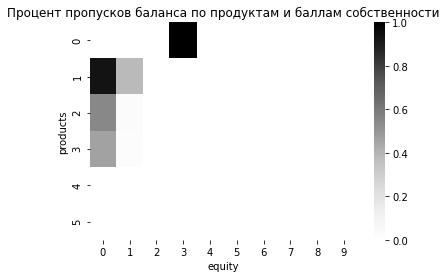

In [26]:
### КОД РЕВЬЮЕРА 2
sns.heatmap(
    df.pivot_table(
        index='products', 
        columns='equity', 
        values='balance', 
        aggfunc=lambda row: row.isna().mean()),
    cmap='Greys')\
   .set(title="Процент пропусков баланса по продуктам и баллам собственности");

### products

In [27]:
df['products'].value_counts()

2    5095
1    3306
3    1028
4     474
5      19
0       1
Name: products, dtype: int64

In [28]:
#проверим продукт 0
df.query('products == 0')

,user_id,score,city,gender,age,equity,balance,products,credit_card,last_activity,est_salary,churn
8957,147837,962,Рыбинск,Ж,79.000,3,NaN,0,0,0,"25,063.960",1


У нас такой единичный случай, можно удалить. Плюс, возможно это уже неактивный клиент

In [29]:
# удаление
df = df.loc[~(df['products']== 0)]
df['products'].value_counts()

df.query('products == 0')

,user_id,score,city,gender,age,equity,balance,products,credit_card,last_activity,est_salary,churn


### credit_card

In [30]:
df['credit_card'].value_counts()

1    6748
0    3174
Name: credit_card, dtype: int64

Аномалий не найдено

### last_activity

In [31]:
df['last_activity'].value_counts()

1    5193
0    4729
Name: last_activity, dtype: int64

Аналогично нечего править

### est_salary

Text(0.5, 0, 'Зарплата')

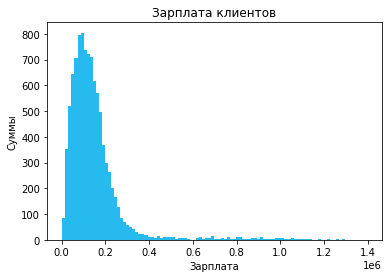

In [32]:
# график для est_salary
df['est_salary'].sort_values().plot(y = 'est_salary', kind = 'hist', bins = 100, 
                                        range=(df['est_salary'].min(),df['est_salary'].max()), color="#26baee")
plt.title('Зарплата клиентов')

plt.ylabel('Суммы')
plt.xlabel('Зарплата')

In [33]:
# посмотрим детальнее на большую зп
df_salary = df.loc[(df['est_salary']> 1100000)]
df_salary.sort_values('est_salary', ascending = False)

,user_id,score,city,gender,age,equity,balance,products,credit_card,last_activity,est_salary,churn
4005,163640,912,Ярославль,М,35.000,4,"15,624,095.800",2,0,1,"1,395,064.450",0
4637,149430,961,Ярославль,М,37.000,5,"4,054,667.810",3,0,0,"1,363,549.520",0
4473,216422,956,Ярославль,М,27.000,0,NaN,1,1,0,"1,333,687.360",0
1600,197637,785,Ярославль,М,41.000,0,NaN,1,1,0,"1,307,090.180",0
5160,174746,731,Ярославль,Ж,30.000,0,NaN,2,1,0,"1,296,838.080",0
149,218801,958,Ярославль,М,34.000,0,NaN,1,1,0,"1,292,825.740",0
8147,135243,951,Ярославль,М,38.000,5,"14,134,432.030",2,1,0,"1,281,547.730",0
9103,123965,939,Ярославль,М,34.000,5,"9,346,657.080",1,1,1,"1,263,028.490",1
9711,193979,754,Ярославль,Ж,53.000,0,NaN,1,1,0,"1,261,408.410",0
1468,162749,940,Ярославль,М,32.000,2,"4,508,306.650",2,1,0,"1,260,919.560",0


Из полученных данных о заработной плате можно сказать, что график растянут и есть редкие клиенты, котрые получают зп > 1100000, однако это не настолько маленькая группа. Деньги, приходящие с них большие, поэтому удалять мы их не будем, но будем считать их отдельной группой, т.к с таким доходом они потенциально важные клиенты.

In [34]:
# посмотрим в каких границах зп
display(df['est_salary'].min())
display(df['est_salary'].max())

2546.3

1395064.45

In [35]:
# посмотрим есть ли ниже МРОТ = 16 242
min_salary = df.loc[(df['est_salary']< 16242)]
min_salary.sort_values('est_salary', ascending = False)

,user_id,score,city,gender,age,equity,balance,products,credit_card,last_activity,est_salary,churn
1125,212017,812,Ростов,М,21.000,1,"25,514.590",2,1,0,"16,220.590",0
8189,126549,969,Ярославль,Ж,62.000,5,"343,938.500",2,0,0,"16,189.540",0
4705,216864,813,Ростов,М,25.000,5,"368,864.120",2,1,1,"16,186.580",0
3659,141702,756,Рыбинск,Ж,55.000,5,"1,457,258.510",2,1,1,"16,170.950",0
4945,199350,764,Ростов,М,34.000,5,"269,213.570",2,1,1,"16,158.900",0
...,...,...,...,...,...,...,...,...,...,...,...,...
1700,155567,747,Ростов,М,25.000,0,"5,750.920",1,1,0,"7,054.820",0
4860,193417,823,Ростов,Ж,64.000,2,"277,249.690",2,0,0,"5,341.500",0
1753,161271,836,Ярославль,Ж,19.000,4,"7,703.050",4,1,1,"5,043.140",0
2186,201407,938,Рыбинск,Ж,69.000,1,"325,483.520",3,0,1,"3,487.330",0


Text(0.5, 0, 'Зарплата')

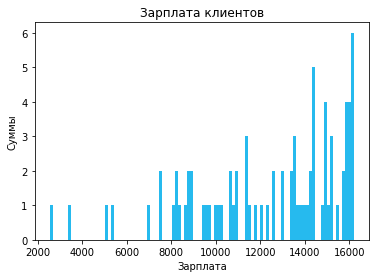

In [36]:
min_salary['est_salary'].sort_values().plot(y = 'est_salary', kind = 'hist', bins = 100, 
                                        range=(min_salary['est_salary'].min(),min_salary['est_salary'].max()), color="#26baee")
plt.title('Зарплата клиентов')

plt.ylabel('Суммы')
plt.xlabel('Зарплата')

Эту группу мы так же оставим, т.к она не очень большая и не будет давать искажений в анализе

Text(0.5, 0, 'Зарплата')

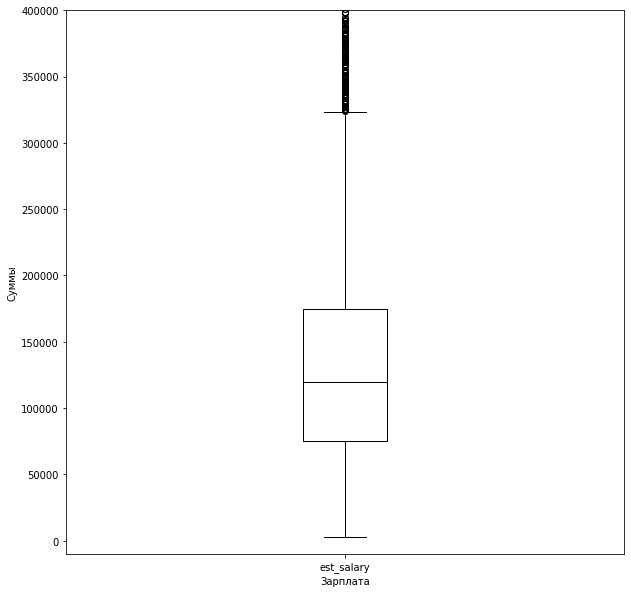

In [37]:
#добавила пункт
plt.figure(figsize=(10, 10))
df.boxplot(column=['est_salary'], grid= False , color='black')
plt.ylim([-10000, 400000])

plt.ylabel('Суммы')
plt.xlabel('Зарплата')

На графике видим с какой отметки у нас идут выбросы.

### churn

In [38]:
df['churn'].value_counts()

0    8104
1    1818
Name: churn, dtype: int64

### Добавим некоторые столбцы

In [39]:
#скопировала города и применила get_dummies
df['city_name'] = df['city']
df['gender_МЖ'] = df['gender']

df = pd.get_dummies(data=df, columns=['city_name', 'gender'])
df

,user_id,score,city,age,equity,balance,products,credit_card,last_activity,est_salary,churn,gender_МЖ,city_name_Ростов,city_name_Рыбинск,city_name_Ярославль,gender_Ж,gender_М
0,183012,850,Рыбинск,25.000,1,"59,214.820",2,0,1,"75,719.140",1,Ж,0,1,0,1,0
1,146556,861,Рыбинск,37.000,5,"850,594.330",3,1,0,"86,621.770",0,Ж,0,1,0,1,0
2,120722,892,Рыбинск,30.000,0,NaN,1,1,1,"107,683.340",0,Ж,0,1,0,1,0
3,225363,866,Ярославль,51.000,5,"1,524,746.260",2,0,1,"174,423.530",1,Ж,0,0,1,1,0
4,157978,730,Ярославль,34.000,5,174.000,1,1,0,"67,353.160",1,М,0,0,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,120553,814,Рыбинск,27.000,1,"78,144.650",1,0,1,"18,943.640",0,М,0,1,0,0,1
9996,139170,894,Ярославль,46.000,0,NaN,1,1,0,"196,898.290",0,М,0,0,1,0,1
9997,115639,903,Ярославль,24.000,0,NaN,2,1,1,"108,905.090",0,М,0,0,1,0,1
9998,148700,777,Ярославль,68.000,3,"865,457.970",3,0,1,"86,874.900",0,Ж,0,0,1,1,0


In [40]:
#добавляю разные столбцы для дальнейшего анализа
df['balance_n'] = df['balance'].isna()#str.contains('')
df['balance_n'] = df['balance_n'].replace('False','1').astype('int')

df['balance_y'] = df['balance'].notnull()#str.contains('')
df['balance_y'] = df['balance_y'].replace('False','1').astype('int')

df['balance_vip'] = np.where(df['balance']>2000000, '1', '0')
df['balance_vip'] = df['balance_vip'].astype('int')

df['salary_vip'] = np.where(df['est_salary']>320000, '1', '0')
df['salary_vip'] = df['salary_vip'].astype('int')

df['not_only_cc'] = np.where((df['products']>df['credit_card'])&(df['credit_card']==1), '1', '0')
df['not_only_cc'] = df['not_only_cc'].astype('int')

df['gender_Ж'] = df['gender_Ж'].astype('int')
df['gender_М'] = df['gender_М'].astype('int')

df['city_name_Ростов'] = df['city_name_Ростов'].astype('int')
df['city_name_Рыбинск'] = df['city_name_Рыбинск'].astype('int')
df['city_name_Ярославль'] = df['city_name_Ярославль'].astype('int')

df

,user_id,score,city,age,equity,balance,products,credit_card,last_activity,est_salary,...,city_name_Ростов,city_name_Рыбинск,city_name_Ярославль,gender_Ж,gender_М,balance_n,balance_y,balance_vip,salary_vip,not_only_cc
0,183012,850,Рыбинск,25.000,1,"59,214.820",2,0,1,"75,719.140",...,0,1,0,1,0,0,1,0,0,0
1,146556,861,Рыбинск,37.000,5,"850,594.330",3,1,0,"86,621.770",...,0,1,0,1,0,0,1,0,0,1
2,120722,892,Рыбинск,30.000,0,NaN,1,1,1,"107,683.340",...,0,1,0,1,0,1,0,0,0,0
3,225363,866,Ярославль,51.000,5,"1,524,746.260",2,0,1,"174,423.530",...,0,0,1,1,0,0,1,0,0,0
4,157978,730,Ярославль,34.000,5,174.000,1,1,0,"67,353.160",...,0,0,1,0,1,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,120553,814,Рыбинск,27.000,1,"78,144.650",1,0,1,"18,943.640",...,0,1,0,0,1,0,1,0,0,0
9996,139170,894,Ярославль,46.000,0,NaN,1,1,0,"196,898.290",...,0,0,1,0,1,1,0,0,0,0
9997,115639,903,Ярославль,24.000,0,NaN,2,1,1,"108,905.090",...,0,0,1,0,1,1,0,0,0,1
9998,148700,777,Ярославль,68.000,3,"865,457.970",3,0,1,"86,874.900",...,0,0,1,1,0,0,1,0,0,0


Больше менять ничего не будем

### Вывод
Мы мосмотрели данные детально по всем столбцам, избавились от некоторых аномалий и добавили дополнительные столбцы. Теперь можно приступать к бизнес-анализу

## Анализ данных

### Общие графики отточных и неотточных клиентов (пунк добавлен)

Посмотрим какие данные остались и есть ли что-то что нужно еще подправить

In [41]:
df.describe()

,user_id,score,age,equity,balance,products,credit_card,last_activity,est_salary,churn,city_name_Ростов,city_name_Рыбинск,city_name_Ярославль,gender_Ж,gender_М,balance_n,balance_y,balance_vip,salary_vip,not_only_cc
count,"9,922.000","9,922.000","9,922.000","9,922.000","7,663.000","9,922.000","9,922.000","9,922.000","9,922.000","9,922.000","9,922.000","9,922.000","9,922.000","9,922.000","9,922.000","9,922.000","9,922.000","9,922.000","9,922.000","9,922.000"
mean,"171,733.889",848.721,42.726,2.634,"828,248.160",1.872,0.680,0.523,"147,898.874",0.183,0.143,0.267,0.590,0.499,0.501,0.228,0.772,0.043,0.049,0.392
std,"33,695.215",65.394,12.172,1.979,"1,984,247.693",0.793,0.466,0.499,"139,365.465",0.387,0.350,0.443,0.492,0.500,0.500,0.419,0.419,0.203,0.217,0.488
min,"94,561.000",642.000,18.000,0.000,0.000,1.000,0.000,0.000,"2,546.300",0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
25%,"142,715.000",802.000,33.000,0.000,"295,498.985",1.000,0.000,0.000,"75,254.045",0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000
50%,"172,643.000",853.000,40.000,3.000,"524,961.220",2.000,1.000,1.000,"119,735.430",0.000,0.000,0.000,1.000,0.000,1.000,0.000,1.000,0.000,0.000,0.000
75%,"201,157.750",900.000,51.000,4.000,"980,801.490",2.000,1.000,1.000,"174,679.637",0.000,0.000,1.000,1.000,1.000,1.000,0.000,1.000,0.000,0.000,1.000
max,"229,145.000","1,000.000",86.000,9.000,"119,113,552.010",5.000,1.000,1.000,"1,395,064.450",1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000


In [42]:
#строим графики
def tables(data, hue=None):
    #дискретные значения
    for column in ['credit_card','last_activity','city_name_Ростов','city_name_Рыбинск','city_name_Ярославль',
                   'gender_Ж','gender_М','balance_n','balance_y', 'balance_vip', 'salary_vip', 'not_only_cc']:
        ax = sns.countplot(data=data, x=column, hue=hue);
        plt.title(f'Распределение клиентов по признаку {column}', fontsize = 16, color = 'black')
        plt.show()
    
    plt.figure(figsize=(16,7))
    sns.countplot(data=data, x='age', hue=hue);
    plt.title('Распределение клиентов по признаку age', fontsize = 16, color = 'black')
    plt.xticks(rotation=90)
    plt.show()

    #непрерывные значения
    for column in ['score', 'age', 'equity', 'balance', 'products', 'est_salary']:
        sns.kdeplot(data=data, x=column, hue=hue);
        plt.title(f'Распределение клиентов по признаку {column}', fontsize = 16, color = 'black')
        plt.show()

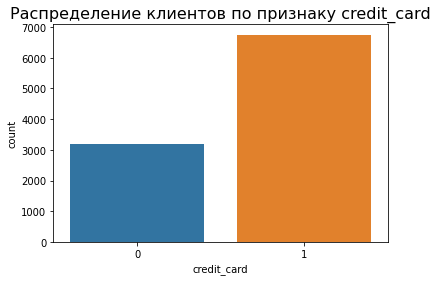

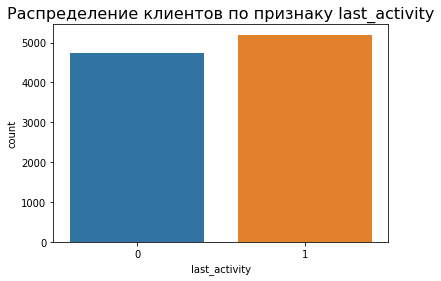

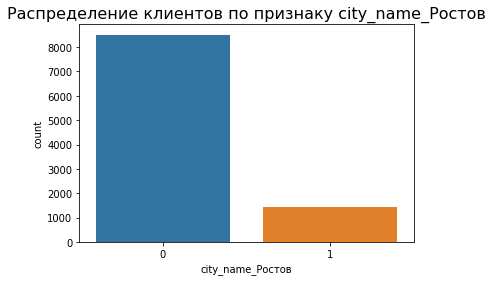

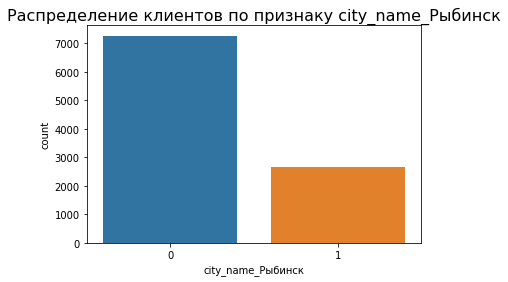

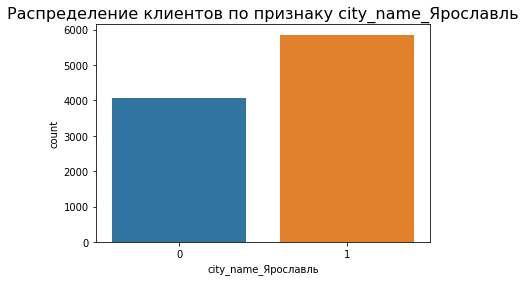

...

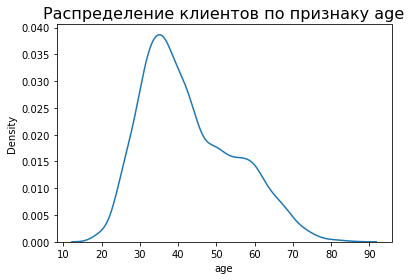

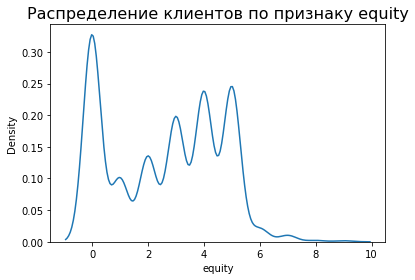

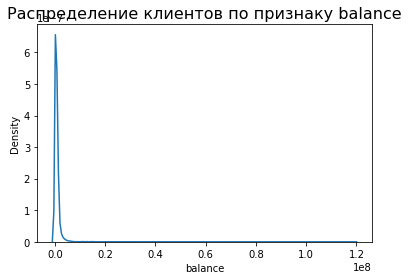

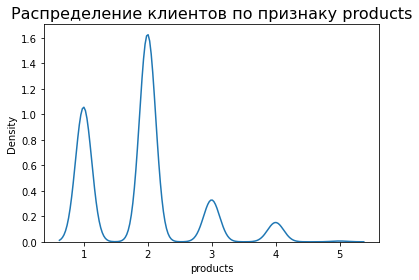

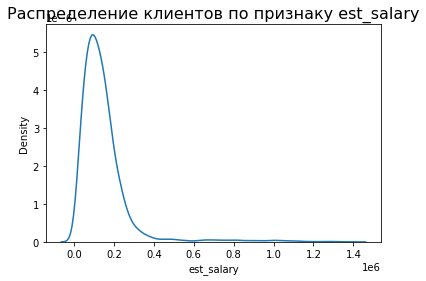

In [43]:
#выводим
tables(df, hue=None) 

In [44]:
print(' Средний показатель оттока по банку: {}%'.format(((df['churn'].mean())*100).round(1)))

 Средний показатель оттока по банку: 18.3%


Графики выглядят без каких-либо замечаний. где-то конечно есть перекосы, но это можно логично объяснить. И мы вычислили средний показатель оттока по банку

### Сравнение остающихся и уходящих

Теперь сравним клиентов, которые хотят уйти и которые остаются, выделим группы для дальнейшего анализа 

In [45]:
# копируем датасет
df_1 = df.copy(deep=True)
# разделяем на "ушли" и "остались"
df_churn_0 = df_1[df_1['churn'] == 0] 
df_churn_1 = df_1[df_1['churn'] == 1] 

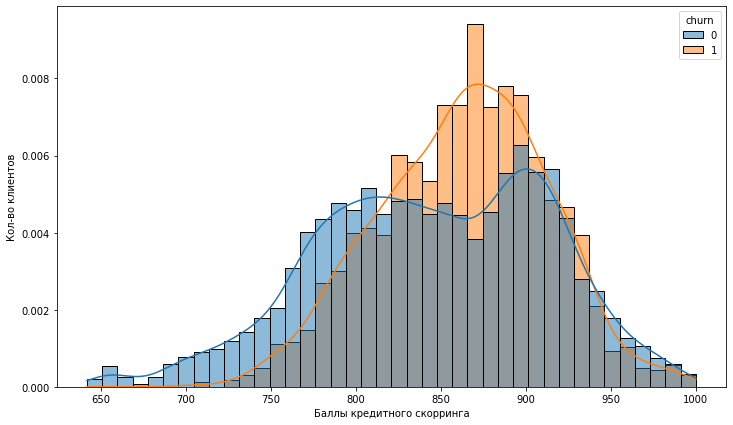

In [46]:
# выводим график 
plt.figure(figsize=(12, 7))
#ax = ax.ravel()

#score
sns.histplot(
    data = df[['churn', 'score']],
    x='score',
    stat='density',
    common_norm=False,
    hue='churn',
    kde=True);

plt.ylabel('Кол-во клиентов')
plt.xlabel('Баллы кредитного скорринга')

plt.show()

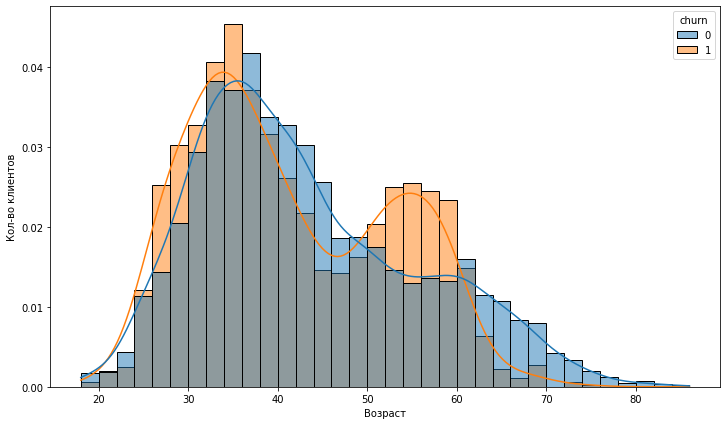

In [47]:
plt.figure(figsize=(12, 7))

sns.histplot(
    data = df[['churn', 'age']],
    x='age',
    stat='density',
    common_norm=False,
    hue='churn', binwidth=2,
    kde=True);

plt.ylabel('Кол-во клиентов')
plt.xlabel('Возраст')

plt.show()

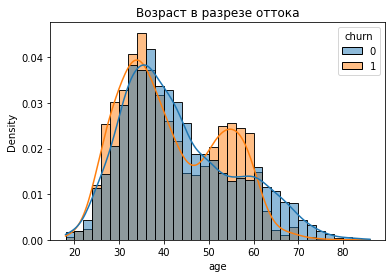

In [48]:
### КОД РЕВЬЮЕРА 2
sns.histplot(data=df,hue='churn',x='age',kde=True,common_norm=False,binwidth=2,stat='density')\
   .set(title='Возраст в разрезе оттока');

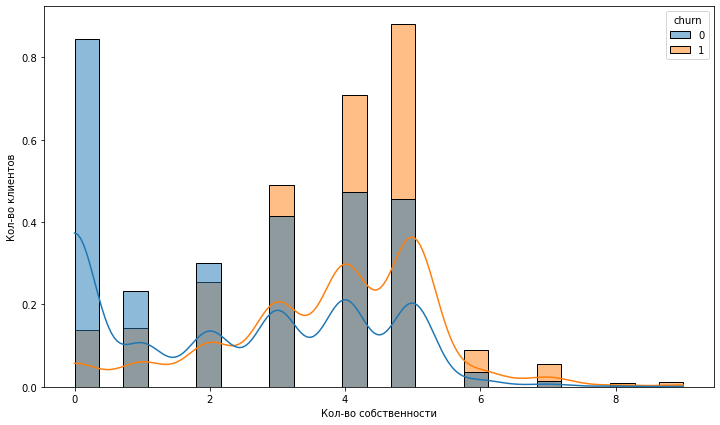

In [49]:
plt.figure(figsize=(12, 7))

#equity
sns.histplot(
    data = df[['churn', 'equity']],
    x='equity',
    stat='density',
    common_norm=False,
    hue='churn',
    kde=True);

plt.ylabel('Кол-во клиентов')
plt.xlabel('Кол-во собственности')

plt.show()

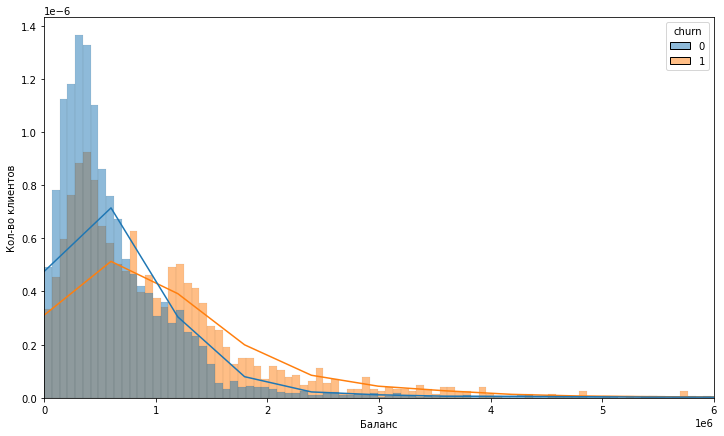

In [50]:
plt.figure(figsize=(12, 7)) 
#balance
sns.histplot(
    data = df[['churn', 'balance']],
    x='balance',
    stat='density',
    common_norm=False,
    hue='churn',
    kde=True);
plt.xlim([0, 6000000])

plt.ylabel('Кол-во клиентов')
plt.xlabel('Баланс')

plt.show()    

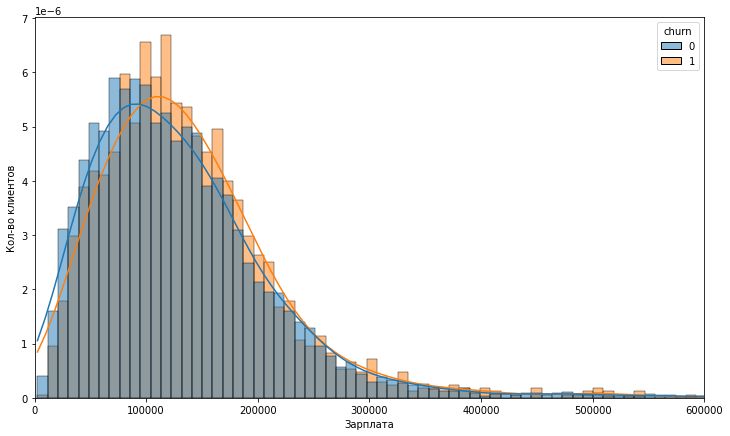

In [51]:
plt.figure(figsize=(12, 7))
#balance
sns.histplot(
    data = df[['churn', 'est_salary']],
    x='est_salary',
    stat='density',
    common_norm=False,
    hue='churn',
    kde=True);
plt.xlim([0, 600000])

plt.ylabel('Кол-во клиентов')
plt.xlabel('Зарплата')

plt.show()

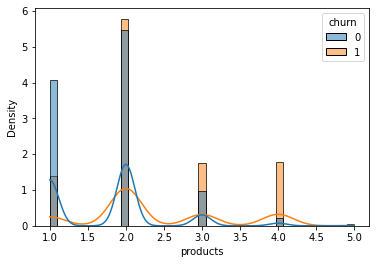

<Figure size 288x288 with 0 Axes>

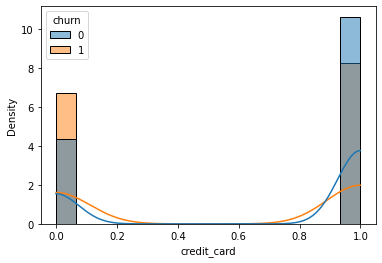

<Figure size 288x288 with 0 Axes>

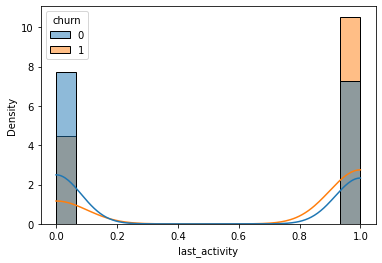

<Figure size 288x288 with 0 Axes>

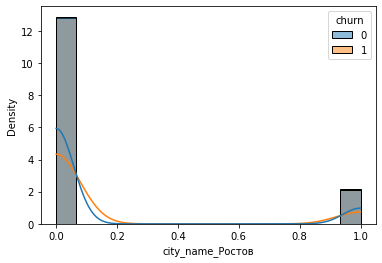

<Figure size 288x288 with 0 Axes>

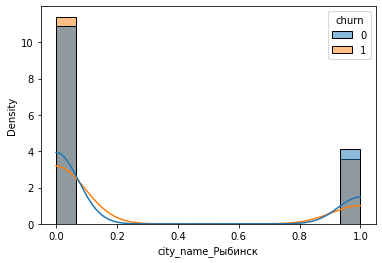

<Figure size 288x288 with 0 Axes>

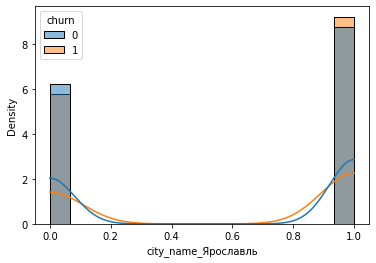

<Figure size 288x288 with 0 Axes>

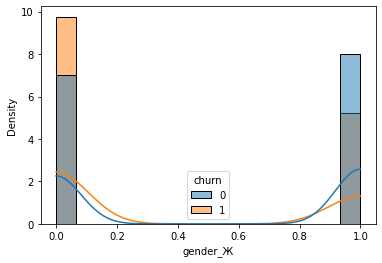

<Figure size 288x288 with 0 Axes>

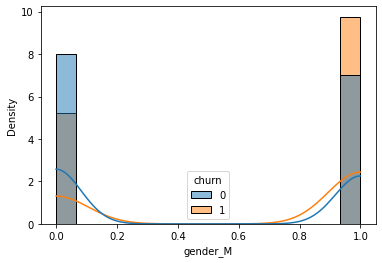

<Figure size 288x288 with 0 Axes>

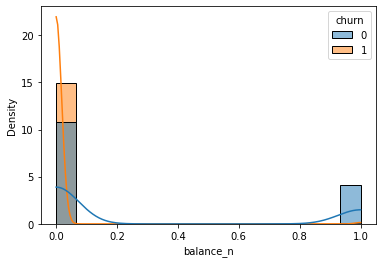

<Figure size 288x288 with 0 Axes>

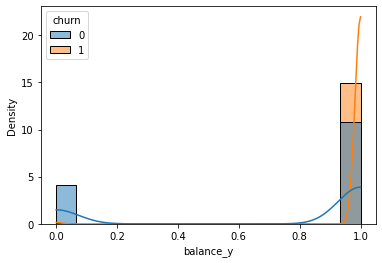

<Figure size 288x288 with 0 Axes>

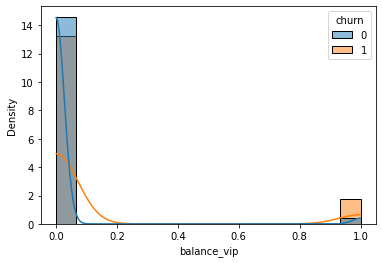

<Figure size 288x288 with 0 Axes>

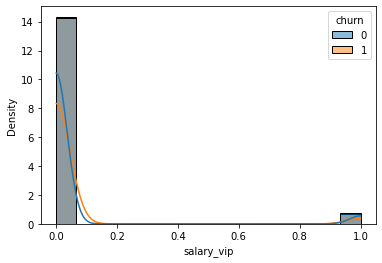

<Figure size 288x288 with 0 Axes>

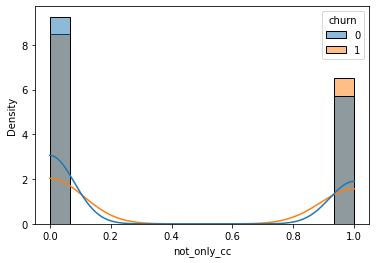

<Figure size 288x288 with 0 Axes>

In [52]:
for column in ['products','credit_card','last_activity','city_name_Ростов','city_name_Рыбинск',
               'city_name_Ярославль','gender_Ж','gender_М',
               'balance_n','balance_y', 'balance_vip', 'salary_vip', 'not_only_cc']:

    sns.histplot(
    data = df[['churn', column]],
    x=column,
    stat='density',
    common_norm=False,
    hue='churn',
    kde=True);
    plt.figure(figsize=(4, 4))
    plt.tight_layout(4)
    plt.show()
    

Диапазоны по графикам:

score 
- отточны 825-910 и 920-935 (самый пик на 845-885)
- остаются <825, 910-920 и >935

age
- отточны 24-30, 30-37, 50-59
- остаются <24, 38-49, >60

equity
- отточны от 3х объектов
- остаются <3х

balance
- отточны 750000 
- остаются <750000 

est_salary
- самые отточные 95000-140000, 160000-215000
- остаются в освновном с зп <80000

products
- отточны клиенты от 2х продуктов
- остаются с одним продуктом

credit_card
- отточны клиенты у которых нет кредиток
- остаются с кредитными картами

last_activity
- отточны активные клиенты
- остаются неактивные клиенты

city
- с Ярославля есть небольшой отток
- в Рыбинске нет оттока
- в Ростове почти равное кол-во отточных и остающихся

gender
- отточны мужчины
- остаются женщины

balance заполнено
- отточны те, у кого есть баланс
- остаются те, у кого null

vip
- отточны vip-клиенты с большим балансом
- по зп примерно одинаково

not_only_cc
- отточны те, у кого по продуктам есть еще что-то кроме карты




In [53]:
#проверка кол-ва групп для выводов
print('score :', len(df.query('(score > 850) & (score < 900)')))

print('age 65 :', len(df.query('(age > 65)')))

print('age 31-40 :', len(df.query('(age > 31) & (age < 40)')))

print('age 50-60 :', len(df.query('(age > 50) & (age < 60)')))

print('equity :', len(df.query('(equity > 4)')))

print('balance :', len(df.query('(balance > 800000)')))

print('products :', len(df.query('(products > 3)')))


score : 2581
age 65 : 486
age 31-40 : 3010
age 50-60 : 1407
equity : 2179
balance : 2499
products : 493


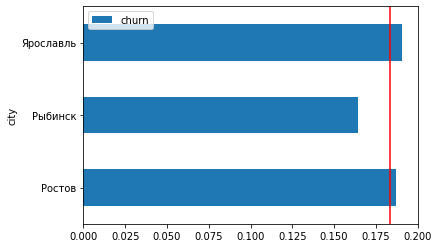

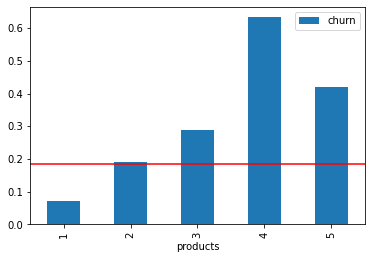

In [54]:
### КОД РЕВЬЮЕРА 2
df.groupby('city').agg({'churn':'mean'}).plot(kind='barh').axvline(df.churn.mean(),c='red')
df.groupby('products').agg({'churn':'mean'}).plot.bar().axhline(df.churn.mean(),c='red');

#### Графики категориальных характеристик с уровням оттока




In [55]:
df

,user_id,score,city,age,equity,balance,products,credit_card,last_activity,est_salary,...,city_name_Ростов,city_name_Рыбинск,city_name_Ярославль,gender_Ж,gender_М,balance_n,balance_y,balance_vip,salary_vip,not_only_cc
0,183012,850,Рыбинск,25.000,1,"59,214.820",2,0,1,"75,719.140",...,0,1,0,1,0,0,1,0,0,0
1,146556,861,Рыбинск,37.000,5,"850,594.330",3,1,0,"86,621.770",...,0,1,0,1,0,0,1,0,0,1
2,120722,892,Рыбинск,30.000,0,NaN,1,1,1,"107,683.340",...,0,1,0,1,0,1,0,0,0,0
3,225363,866,Ярославль,51.000,5,"1,524,746.260",2,0,1,"174,423.530",...,0,0,1,1,0,0,1,0,0,0
4,157978,730,Ярославль,34.000,5,174.000,1,1,0,"67,353.160",...,0,0,1,0,1,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,120553,814,Рыбинск,27.000,1,"78,144.650",1,0,1,"18,943.640",...,0,1,0,0,1,0,1,0,0,0
9996,139170,894,Ярославль,46.000,0,NaN,1,1,0,"196,898.290",...,0,0,1,0,1,1,0,0,0,0
9997,115639,903,Ярославль,24.000,0,NaN,2,1,1,"108,905.090",...,0,0,1,0,1,1,0,0,0,1
9998,148700,777,Ярославль,68.000,3,"865,457.970",3,0,1,"86,874.900",...,0,0,1,1,0,0,1,0,0,0


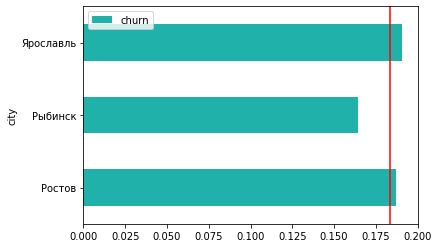

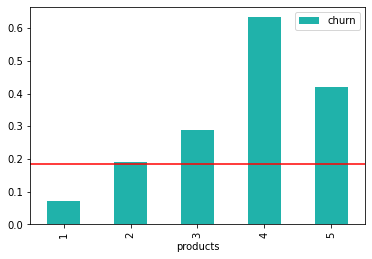

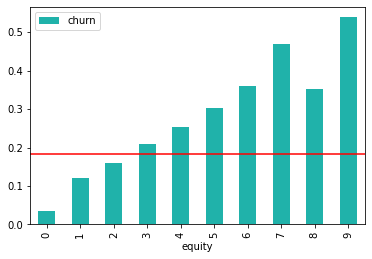

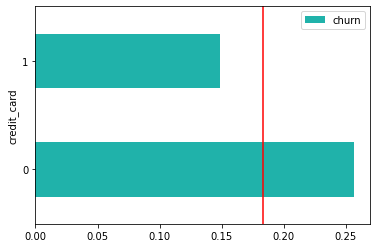

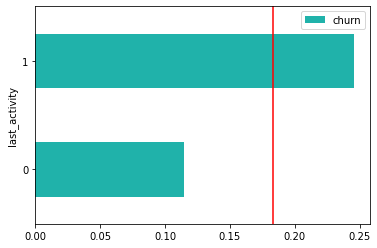

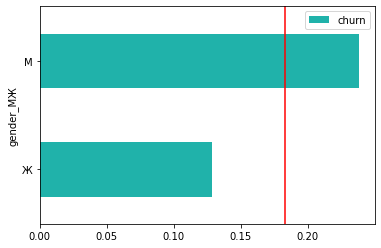

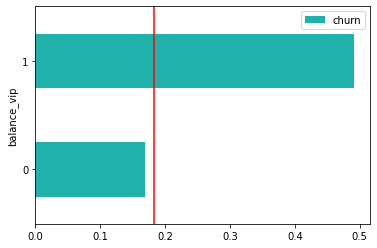

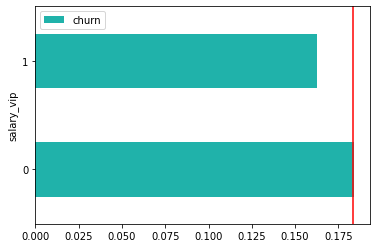

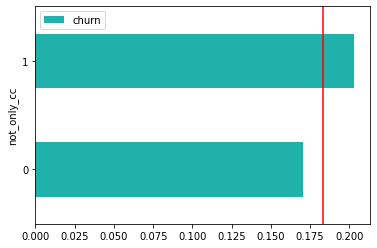

In [56]:
df.groupby('city').agg({'churn':'mean'}).plot(kind='barh', color='#20B2AA').axvline(df.churn.mean(),c='red')
df.groupby('products').agg({'churn':'mean'}).plot.bar(color='#20B2AA').axhline(df.churn.mean(),c='red');
df.groupby('equity').agg({'churn':'mean'}).plot.bar(color='#20B2AA').axhline(df.churn.mean(),c='red');
df.groupby('credit_card').agg({'churn':'mean'}).plot(kind='barh', color='#20B2AA').axvline(df.churn.mean(),c='red')
df.groupby('last_activity').agg({'churn':'mean'}).plot(kind='barh', color='#20B2AA').axvline(df.churn.mean(),c='red')
df.groupby('gender_МЖ').agg({'churn':'mean'}).plot(kind='barh', color='#20B2AA').axvline(df.churn.mean(),c='red')
df.groupby('balance_vip').agg({'churn':'mean'}).plot(kind='barh', color='#20B2AA').axvline(df.churn.mean(),c='red')
df.groupby('salary_vip').agg({'churn':'mean'}).plot(kind='barh', color='#20B2AA').axvline(df.churn.mean(),c='red')
df.groupby('not_only_cc').agg({'churn':'mean'}).plot(kind='barh', color='#20B2AA').axvline(df.churn.mean(),c='red')

Видим, что:
- <u>По баллам кредитного скоринга</u> происходит отток клиентов с хорошим баллом(825-910), а с низким нет оттока. Возможно связанно с тем, что условия в других банках лучше и клиент с хорошим показателем может спокойно перейти к конкурентам, что, например, не может себе позволить клиент с низким баллом. Требуются продукты или заманчивые условия, которые могут привлечь внимание выгодных клиетов с хорошим баллом.
- <u>По городам</u> есть отток для Ярославля, в Рыбинске его нет, а в Ростове почти равное количество. Возможно, тут можно предложить какие-то скидки, привязаннве к городу - например, кешбэк с каких-то магазинов, которые в этих городах.
- <u>По полу</u> Мужчины более отточны, чем женщины. Можно добавить новый продукт, например, дебетовыю карту для автомобилистов,  которой будет выгодно расплачиваться на заправках или СТО.
- <u>По возрасту</u> можно предположить, что после 60 лет могут быть клиенты либо неактивные, либо не заинтересованные в смене банка, в любом случае - это не самая опасная категория для банка. Такие группы как 24-30, 30-37, 50-59 склонны уходить из нашего банка. Скорее всего для групп 24-30, 30-37 это связанно с рефинансированием кредитов/ипотек, а группа 50-59 может быть связанна с уходом на пенсию и, например, желание иметь финансы не в банке. Тут можно предложить улучшить условия рефинансирования ипотеки(может повлиять и на приход новых клиентов), а так же можно сделать хорошие условия по пенсионным депозитам, которые могут снизить отток и для предпенсионной группы.
- <u>По количеству баллов собственности</u> видна тенденция, что если больше собственности, то клиент склонен уходить. В этом случае, скорее всего у клиентов нет обязательств перед банком и им могут быть мало интересны кредиты, для этой категории можно предложить инвестиции. Клиенты явно заинтересованны во вложениях своих финансов
- <u>По балансу</u> можно сказать, что клиенты с большим балансом могут уходить из банка, что не является хорошим показателем для оборотов банка. Аналогично прошлому пункту, я бы продложила инвестиции или покупку валют(+развитие дебетовых валютных счетов) 
- <u>По продуктам</u> наш банк покидают клиенты с 2мя продуктами, что опять таки может быть связанно с не очень выгодными условиями. Отдельно рассмотрены клиенты у которых есть кредитная карта и +1 продукт, там картина аналогична. 
- <u>По кредитной карте</u> уходят клиенты, у которых нет кредитных карт, может говорить о том, что их не заинтересовывает предложение, а следовательно, условия.
- <u>По активности клиента</u> отточны клиенты, которые недавно обращались в банк. Возможно, то, зачем они обращались в банк и повлияло на их решение. тут нужна дополнительная информация. 
- <u>По заработной плате</u> самые отточные 95000-140000, 160000-215000, такие клиенты важны и их можно попытаться удержать, например, премиальным обслуживанием, с дополнительными бонусами. остаются клиенты с зп <80000

### Сравнение средних показателей

In [57]:
df_1.groupby(['churn']).mean().T.sort_values(by = 0, ascending = False)

churn,0,1
balance,"733,828.602","1,134,458.209"
user_id,"171,900.133","170,992.834"
est_salary,"147,795.992","148,357.483"
score,845.436,863.362
age,43.016,41.430
equity,2.381,3.763
products,1.758,2.377
balance_y,0.723,0.993
credit_card,0.709,0.552
city_name_Ярославль,0.585,0.614


По средним показателям можем сказать, что:
- Склонны уходить клиенты с большим балансом
- Средняя заработная плата примерно одинаковая в обоих случаях
- Баллы кредитного скоринга примерно одинаковы
- Возраст примерно равен
- Клиенты с чуть большим количеством недвижимости попадают в отток
- Люди, у которых больше одного продукта могут уходить из банка
- Отточны клиенты, у которых есть баланс, а к которых в балансе null не отточны
- Вероятность того, что человек без кредитной карты уйдет чуть больше
- из всех городов из Ярославля клиенты более склонны уходить

Из остальных показателей нельзя отобрать средние значения, т.к они являются флагами

### Корреляционные матрицы 

Построим матрицу корреляции и отдельно по столбцу оттока

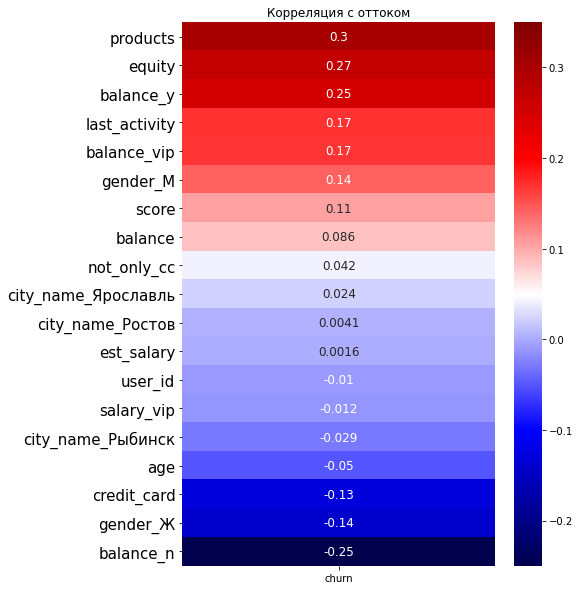

In [58]:
df.describe()

plt.figure(figsize=(7, 10))
heatmap = sns.heatmap(df.corr()[['churn']].sort_values(by='churn', ascending=False).drop(['churn'], axis=0), \
                      vmin=-0.25, vmax=0.35, annot=True, annot_kws={"size":12}, cmap='seismic')
plt.tick_params(axis='y', labelsize=15)
heatmap.set_title('Корреляция с оттоком')
plt.show()

Каких-то сильных зависимостей мы тут не наблюдаем, есть средние и слабые зависимости по product, equity, balance_y, last_activity, balance_vip, gender_М, score

Нет корреляции с balbance_n, gender_Ж, credit_card, но это ананлогично слабо выражено

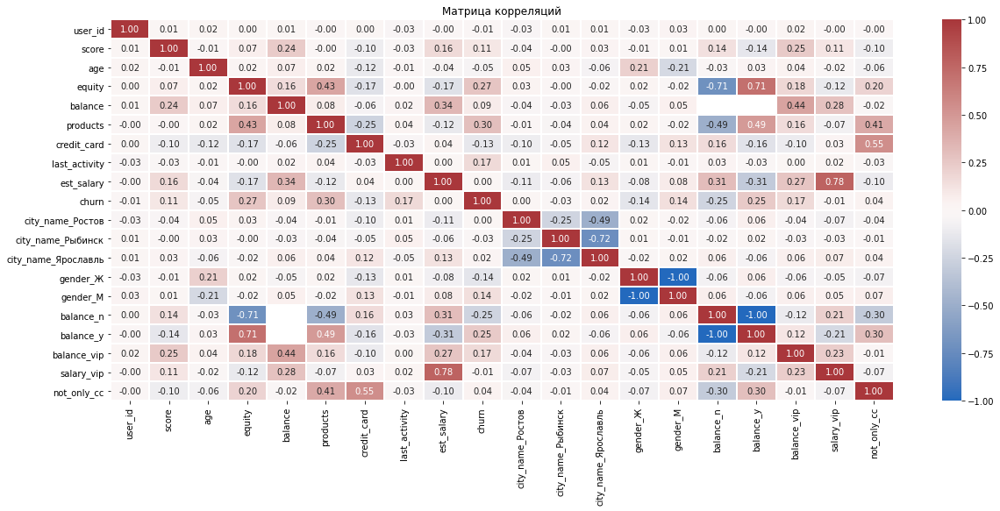

In [59]:
df.corr()

corr_m = df.corr()
plt.figure(figsize=(20, 8))
sns.heatmap(corr_m, cmap="vlag", annot = True, fmt='.2f', linewidths=1) 
plt.title('Матрица корреляций');

Ранее мы уже писали, что баланс имеет связь с собственностью. Это теперь показано с разбивкой на заполненный и не заполненный баланс. В остальном каких-то сильных зависимостей, если не говорить о столбцах, которые заполнялись из других, нет

### Портрет уходящих клиентов (добавлен как отдельный пункт)

На основе графиков, которые были проанализированы ранее, мы уже можем сказать какие группы есть отточные. Теперь нам требуется составить сегменты (600-2000 клиентов), которые высокоотточны(> cреднего показателя оттока по банку в 18.3%) и приоритизировать их. Для этого выведем в процентном соотношении отточных и оставшихся клиентов, для того, чтобы понять какие характеристики включать в сегменты

In [60]:
#Функция разбивки на возрастные группы
def age_group(age):
    '''оператором сравнения будем проверять значения и выделять каждое в отдельную группу'''
    if age<24:
        return '<24'
    if age<30:
        return '24-30'
    if age<37:
        return '30-37'
    if age<50:
        return '37-50'
    if age<59:
        return '50-59'
    return '>60'

#добавление столбца
df['age_group'] = df['age'].apply(age_group)

#Функция создания сводных таблиц
def prcnt_func(index_a, index_b, column_a, column_b, merged, sort):
    '''создадим таблицу из двух сводных таблиц с расчетом процентов от общего числа по различным группам'''
    a = df.pivot_table(index=index_a, values='user_id', aggfunc='count').reset_index()
    a.columns = column_a
    a= a.sort_values(by='count', ascending=False)
    b = df.pivot_table(index=index_b, values='user_id', aggfunc='count').reset_index()
    b.columns = column_b
    a = a.merge(b, on=merged, how='left')
    a['%'] = (a['count']/a['sum']*100).round()
    return display(a.sort_values(by=sort))

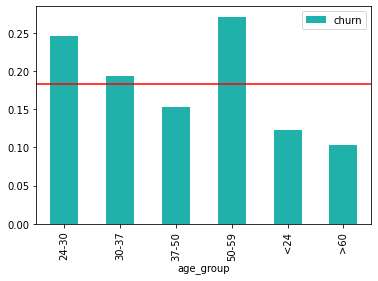

In [61]:
df.groupby('age_group').agg({'churn':'mean'}).plot.bar(color='#20B2AA').axhline(df.churn.mean(),c='red');

<div class="alert alert-success"><b>Комментарий ревьюера 2</b>&nbsp;📝<br>
Лучше делить на категории так:
</div>

In [62]:
### КОД РЕВЬЮЕРА
pd.cut(df.age,[17,24,30,37,50,60,99]).value_counts()

(37, 50]    3236
(30, 37]    2672
(50, 60]    1574
(24, 30]    1181
(60, 99]    1024
(17, 24]     235
Name: age, dtype: int64

In [63]:
index_a = ['age_group', 'churn']
column_a = ['age_group', 'churn', 'count']
index_b = 'age_group'
column_b = ['age_group', 'sum']
merged = 'age_group'
sort = 'age_group'

#Создадим сводную таблицу
prcnt_func(index_a, index_b, column_a, column_b, merged, sort)

,age_group,churn,count,sum,%
4,24-30,0,752,998,75.000
8,24-30,1,246,998,25.000
1,30-37,0,2052,2544,81.000
6,30-37,1,492,2544,19.000
0,37-50,0,2918,3446,85.000
5,37-50,1,528,3446,15.000
3,50-59,0,1069,1467,73.000
7,50-59,1,398,1467,27.000
10,<24,0,128,146,88.000
11,<24,1,18,146,12.000


По численности нам подходят группы 30-37 и 50-59, как и по проценту оттока, возьмем их.	

In [64]:
index_a = ['products', 'churn']
column_a = ['products', 'churn', 'count']
index_b = 'products'
column_b = ['products', 'sum']
merged = 'products'
sort = 'products'

#Создадим сводную таблицу
prcnt_func(index_a, index_b, column_a, column_b, merged, sort)

,products,churn,count,sum,%
1,1,0,3071,3306,93.000
6,1,1,235,3306,7.000
0,2,0,4117,5095,81.000
2,2,1,978,5095,19.000
3,3,0,731,1028,71.000
5,3,1,297,1028,29.000
4,4,1,300,474,63.000
7,4,0,174,474,37.000
8,5,0,11,19,58.000
9,5,1,8,19,42.000


Процент оттока увеличивается с каждым продуктом, но по численности группы уменьшаются. 2 продукта уже перевалили за средний показатель отточности

In [65]:
index_a = ['city', 'churn']
column_a = ['city', 'churn', 'count']
index_b = 'city'
column_b = ['city', 'sum']
merged = 'city'
sort = 'city'

#Создадим сводную таблицу
prcnt_func(index_a, index_b, column_a, column_b, merged, sort)

,city,churn,count,sum,%
2,Ростов,0,1151,1416,81.000
5,Ростов,1,265,1416,19.000
1,Рыбинск,0,2216,2652,84.000
4,Рыбинск,1,436,2652,16.000
0,Ярославль,0,4737,5854,81.000
3,Ярославль,1,1117,5854,19.000


Ростов и Ярославль чуть превышают средний показатель отточности, но у Ярославля больше выборка 

In [66]:
print('всего :', len(df.query('(balance_vip == 1)'))) 
print('всего :', len(df.query('(salary_vip == 1)'))) 

всего : 427
всего : 491


К сожалению, vip-клиентов оказалось очень мало для отдельного анализа. Если добавлять еще какой-то признак, то она очень урезается


<div class="alert alert-success"><b>Комментарий ревьюера 2&nbsp;<big>✔️</big></b></div>

In [67]:
#Функция разбивки на возрастные группы
def score_group(score):
    '''оператором сравнения будем проверять значения и выделять каждое в отдельную группу'''
    if score<825:
        return '<825'
    if score<910:
        return '825-910'
    if score<920:
        return '910-920'
    if score<935:
        return '920-935'
    #if score<59:
    #    return '50-59'
    return '>935'

#применим функцию к датафрейму
df['score_group'] = df['score'].apply(score_group)

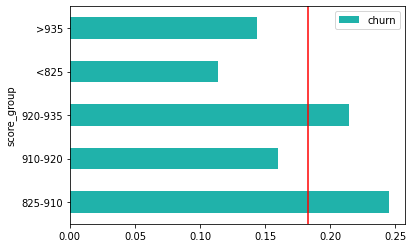

In [68]:
df.groupby('score_group').agg({'churn':'mean'}).plot(kind='barh', color='#20B2AA').axvline(df.churn.mean(),c='red')

In [69]:
index_a = ['score_group', 'churn']
column_a = ['score_group', 'churn', 'count']
index_b = 'score_group'
column_b = ['score_group', 'sum']
merged = 'score_group'
sort = 'score_group'

#Создадим сводную таблицу
prcnt_func(index_a, index_b, column_a, column_b, merged, sort)

,score_group,churn,count,sum,%
0,825-910,0,3356,4444,76.000
2,825-910,1,1088,4444,24.000
4,910-920,0,452,538,84.000
9,910-920,1,86,538,16.000
5,920-935,0,447,569,79.000
7,920-935,1,122,569,21.000
1,<825,0,3176,3585,89.000
6,<825,1,409,3585,11.000
3,>935,0,673,786,86.000
8,>935,1,113,786,14.000


Самая отточная группа 825-910 и по кол-ву клиентов довольно крупная

Теперь собираем наблюдения и сформируем группы

In [70]:
a_products_age=len(df.query('(products > 1) & (age < 37) & (age > 30)'))
b_products_age=len(df.query('(products > 1) & (age < 37) & (age > 30) & (churn == 1)'))
c_products_age=len(df.query('(products > 1) & (age < 37) & (age > 30) & (churn == 0)'))

print('------------------------------------------------------------------------------------------')
print('Больше 1 продукта в возрасте 30-37')
print('всего :', a_products_age)
print('отточные :', b_products_age)
print('остаются :', c_products_age)
print('% оттока :', round(b_products_age/a_products_age *100, 2))

print('------------------------------------------------------------------------------------------')

a_city_m_equity=len(df.query('(city_name_Ярославль == 1) & (gender_М == 1) & (equity >= 3)'))
b_city_m_equity=len(df.query('(city_name_Ярославль == 1) & (gender_М == 1) & (equity >= 3) & (churn == 1)'))
c_city_m_equity=len(df.query('(city_name_Ярославль == 1) & (gender_М == 1) & (equity >= 3)  & (churn == 0)'))

print('Мужчина с Ярославля с >=3 собственности')
print('всего :', a_city_m_equity)
print('отточные :', b_city_m_equity)
print('остаются :', c_city_m_equity)
print('% оттока :', round(b_city_m_equity/a_city_m_equity *100, 2))

print('------------------------------------------------------------------------------------------')

a_f_cc_active=len(df.query('(gender_Ж == 1) & (not_only_cc > 0) & (last_activity == 1) '))
b_f_cc_active=len(df.query('(gender_Ж == 1) & (not_only_cc > 0) & (last_activity == 1) & (churn == 1)'))
c_f_cc_active=len(df.query('(gender_Ж == 1) & (not_only_cc > 0) & (last_activity == 1) & (churn == 0)'))

print('Женщина у которой есть не только кредитная карта, которая недавно обращалась в банк')
print('всего :', a_f_cc_active)
print('отточные :', b_f_cc_active)
print('остаются :', c_f_cc_active)
print('% оттока :', round(b_f_cc_active/a_f_cc_active *100, 2))

print('------------------------------------------------------------------------------------------')

a_score_balance=len(df.query('(score_group == "825-910")& (balance > 750000)'))
b_score_balance=len(df.query('(score_group == "825-910")& (balance > 750000) & (churn == 1)'))
c_score_balance=len(df.query('(score_group == "825-910")& (balance > 750000) & (churn == 0)'))

print('Клиенты у которых балл кредитного скорринга 825-910 и баланс > 750000')
print('всего :', a_score_balance)
print('отточные :', b_score_balance)
print('остаются :', c_score_balance)
print('% оттока :', round(b_score_balance/a_score_balance *100, 2))

print('------------------------------------------------------------------------------------------')

a_score_salary1=len(df.query('(score_group == "825-910") & (est_salary < 215000) & (est_salary > 160000)'))
b_score_salary1=len(df.query('(score_group == "825-910") & (est_salary < 215000) & (est_salary > 160000) & (churn == 1)'))
c_score_salary1=len(df.query('(score_group == "825-910") & (est_salary < 215000) & (est_salary > 160000) & (churn == 0)'))

print('Клиенты у которых балл кредитного скорринга 825-910 и зп 160000-215000')
print('всего :', a_score_salary1)
print('отточные :', b_score_salary1)
print('остаются :', c_score_salary1)
print('% оттока :', round(b_score_salary1/a_score_salary1 *100, 2))

print('------------------------------------------------------------------------------------------')

a_score_salary2=len(df.query('(score_group == "825-910") & (est_salary < 140000) & (est_salary > 95000)'))
b_score_salary2=len(df.query('(score_group == "825-910") & (est_salary < 140000) & (est_salary > 95000) & (churn == 1)'))
c_score_salary2=len(df.query('(score_group == "825-910") & (est_salary < 140000) & (est_salary > 95000) & (churn == 0)'))

print('Клиенты у которых балл кредитного скорринга 825-910 и зп 95000-140000')
print('всего :', a_score_salary2)
print('отточные :', b_score_salary2)
print('остаются :', c_score_salary2)
print('% оттока :', round(b_score_salary2/a_score_salary2 *100, 2))


------------------------------------------------------------------------------------------
Больше 1 продукта в возрасте 30-37
всего : 1482
отточные : 386
остаются : 1096
% оттока : 26.05
------------------------------------------------------------------------------------------
Мужчина с Ярославля с >=3 собственности
всего : 1592
отточные : 587
остаются : 1005
% оттока : 36.87
------------------------------------------------------------------------------------------
Женщина у которой есть не только кредитная карта, которая недавно обращалась в банк
всего : 928
отточные : 155
остаются : 773
% оттока : 16.7
------------------------------------------------------------------------------------------
Клиенты у которых балл кредитного скорринга 825-910 и баланс > 750000
всего : 1394
отточные : 561
остаются : 833
% оттока : 40.24
------------------------------------------------------------------------------------------
Клиенты у которых балл кредитного скорринга 825-910 и зп 160000-215000
всего

Далее обозначим приоритет для этих сегментов и выделим 3 самых высокоотточных:

**Клиенты у которых балл кредитного скорринга 825-910 и баланс > 750000 % оттока : 40.24**

**Мужчина с Ярославля с >=3 собственности % оттока : 36.87**

**Клиенты у которых балл кредитного скорринга 825-910 и зп 95000-140000 % оттока : 28.43**

Клиенты у которых балл кредитного скорринга 825-910 и зп 160000-215000 % оттока : 26.69

Больше 1 продукта в возрасте 30-37 % оттока : 26.05


Группа, которая не прошла по среднему проценту оттока в банке:

Женщина у которой есть не только кредитная карта, которая недавно обращалась в банк % оттока : 16.7

### Вывод

Мы выделили 5 сегментов, которые по численности входят в диапазон от 600 до 2000 и которые превышают % средней отточности по банку и можем дать для 3х самых отточных рекомендации.

_Клиенты у которых балл кредитного скорринга 825-910 и баланс > 750000 % оттока : 40.24_

Предложить рефинансирование кредитов и ипотеки, дополнительно можно заинтересовать инвестированием или выгодным курсов валют+валютным вкладом

_Мужчина с Ярославля с >=3 собственности % оттока : 36.87_

Можно предложить кредыты/ипотеки в залог собственности, дополнительно акцентировав внимание на акции, связанные с городом Ярославль(например в категории развлечения, т.к они привязаны к городу). Это может быть как кешбэк, так и просто скидки на покупки.

_Клиенты у которых балл кредитного скорринга 825-910 и зп 95000-140000 % оттока : 28.43_

Рекомендации могут быть схожи с первой группой. Можно предложить кредитные карты с хорошими условиями или депозитные вклады с большим %

In [71]:
### КОД РЕВЬЮЕРА 2
qrys = (
    'balance > 750000 and 825 < score < 910',
    ' 825 < score < 910 and 95000 < est_salary < 140000', # неудачно, до 220 тыс. будет лучше
    'gender_МЖ == "М" and city == "Ярославль" and equity >= 3')

df_results = pd.concat([
    pd.DataFrame(df.query(q).agg({"churn":['mean','count']}).values,
                 columns=[q],
                 index=['Отток','Размер']).T 
    for q in qrys])

display(df_results.style.format("{:.1%}",subset=["Отток"])\
                   .format("{:_.0f}",subset=["Размер"]))
    
all_catched = pd.concat([df.query(q) for q in qrys])
all_churn = df.churn.sum()
catched = all_catched.drop_duplicates().churn.sum()
share_catched = catched / all_churn

if len(qrys) != 3:
    print('Результаты некорректны, нужно 3 лучших сегмента')
    
if df_results['Отток'].min() < df.churn.mean() * 1.5:
    print('Нужно изменить сегменты: присутствуют недостаточно отточные')
elif df_results['Отток'].min() < df.churn.mean() * 2:
    print('Часть сегментов не высокоотточна')
elif df_results['Отток'].max() > df.churn.mean() * 3:
    print('Нашли очень отточный сегмент')

if df_results['Размер'].min() < 300:
    print('Нужно изменить сегменты: присутствуют слишком мелкие сегменты')
    
if all_catched.shape[0] > 5000:
    print("Отдел маркетинга не сможет обработать такое количество клиентов")
elif all_catched.shape[0] > 3000:
    print("Отделу маркетинга будет сложно обработать такое количество клиентов, его эффективность снизится")
elif all_catched.shape[0] < 1000:
    print("Сегменты можно увеличить")

text_churn = f"{catched}/{all_churn} = {share_catched:.1%}"
if share_catched < 1/3:
    print(f"В сегменты попало недостаточное число отточных: {text_churn}")
elif share_catched < 1/2:
    print(f"В сегменты попало: {text_churn}")
elif share_catched < 2/3:
    print(f"Хороший результат, в сегменты попало: {text_churn}")
else:
    print(f"Прекрасный результат, в сегменты попало: {text_churn}")

,Отток,Размер
balance > 750000 and 825 < score < 910,40.3%,1_383
825 < score < 910 and 95000 < est_salary < 140000,28.5%,1_113
"gender_МЖ == ""М"" and city == ""Ярославль"" and equity >= 3",36.9%,1_592


Часть сегментов не высокоотточна
Отделу маркетинга будет сложно обработать такое количество клиентов, его эффективность снизится
Хороший результат, в сегменты попало: 1033/1818 = 56.8%


## Проверка гипотез

Здесь для проверок некоторых гипотез требуется посмотреть двумя методами(t-критерием и u-критерием), далее можно обоснованно выбрать что-то одно. 

Заранее можно объяснить выбор методов:

Аномально высокие значение могут исказить результаты параметрического t-критерия Стьюдента, следует применять, когда по графикам видно нормальное распределение.

Критерий Уэлча предполагает, что обе группы данных взяты из совокупностей, которые следуют нормальному распределению, но не предполагает, что эти две совокупности имеют одинаковую дисперсию. Для t-критерия Стьюдента дисперсии должны быть равными

Непараметрический критерий Манна-Уитни устойчив выбросам, поэтому в определенных случаях имеет смысл ориентироваться на него.


### Влияние на отток доходов клиентов

Проверим имеет ли влияние на отток финансы клиента. Для этого будем рассматривать est_salary, balance, equity и score(как способность клиента выплатить кредит)	

Тут требуется проверить гипотезу двумя методами - t-критерием и u-критерием


#### est_salary

H0: доходы между клиентами, которые ушли и которые остались не различаются

H1: доходы между клиентами, которые ушли и которые остались различаются

In [72]:
# дисперсия
alpha=0.05

print('Дисперсия ушедших:',df_churn_1['est_salary'].var())
print('Дисперсия оставшихся:',df_churn_0['est_salary'].var())

Дисперсия ушедших: 15112272166.883385
Дисперсия оставшихся: 20391640794.472973


Дисперсия сильно не различается для двух выборок, поэтому можно ориентироваться на  u-критерий

<u>t-критерий</u>

In [73]:
# t-критерий Стьюдента
results = st.ttest_ind(df_churn_0['est_salary'], df_churn_1['est_salary'])
p_value = results.pvalue
print('p-значение:', results.pvalue)

if (results.pvalue < alpha):
    print("Отвергаем нулевую гипотезу")
else:
    print("Не получилось отвергнуть нулевую гипотезу")

p-значение: 0.8766325121997608
Не получилось отвергнуть нулевую гипотезу


In [74]:
# t-критерий Уэлча
results = st.ttest_ind(df_churn_0['est_salary'], df_churn_1['est_salary'], equal_var = False)
p_value = results.pvalue
print('p-значение:', results.pvalue)

if (results.pvalue < alpha):
    print("Отвергаем нулевую гипотезу")
else:
    print("Не получилось отвергнуть нулевую гипотезу")

p-значение: 0.8645271013531297
Не получилось отвергнуть нулевую гипотезу


Из-за того, что дисперсии почти не имели различий, по Стьюденту и Уэлчу мы получили почти похожие результаты.

<u>u-критерий</u>

In [75]:
# u-критерий Манна-Уитни
alpha = 0.05 
results =  st.mannwhitneyu(df_churn_0['est_salary'], df_churn_1['est_salary'], True, 'less')
print('p-значение: ', results.pvalue)

if  results.pvalue < alpha:
    print('Отвергаем нулевую гипотезу: разница статистически значима')
else:
     print('Не получилось отвергнуть нулевую гипотезу, вывод о различии сделать нельзя')

p-значение:  0.00010306800928799795
Отвергаем нулевую гипотезу: разница статистически значима


Наглядно видим разницу методов, ориентируемся на u-критерий, т.к в зарплатах у нас есть выбросы

**H1: доходы между клиентами, которые ушли и которые остались различаются**

#### balance

H0: баланс между клиентами, которые ушли и которые остались не различаются

H1: баланс между клиентами, которые ушли и которые остались различаются

Придется отрезать данные с балансом null, т.к иначе мы не сможем посчитать. Мы не можем заменить на что-то иначе это будет искажать данные. Из всех пунктов этот приблизительный в расчетах

In [76]:
# копируем датасеты с исключением баланса nan
df_churn_00 = df_churn_0.copy(deep=True)
df_churn_00 = df_churn_00.loc[~(df['balance'].isna())]

df_churn_11 = df_churn_1.copy(deep=True)
df_churn_11 = df_churn_11.loc[~(df['balance'].isna())]

display(df_churn_11.loc[(df['balance'].isna())])
display(df_churn_00.loc[(df['balance'].isna())])

#проверяем
print(len(df_churn_0))
print(len(df_churn_00))
print(len(df_churn_1))
print(len(df_churn_11))

,user_id,score,city,age,equity,balance,products,credit_card,last_activity,est_salary,...,city_name_Ростов,city_name_Рыбинск,city_name_Ярославль,gender_Ж,gender_М,balance_n,balance_y,balance_vip,salary_vip,not_only_cc


,user_id,score,city,age,equity,balance,products,credit_card,last_activity,est_salary,...,city_name_Ростов,city_name_Рыбинск,city_name_Ярославль,gender_Ж,gender_М,balance_n,balance_y,balance_vip,salary_vip,not_only_cc


8104
5857
1818
1806


In [77]:
# дисперсия
alpha=0.05

print('Дисперсия ушедших:',df_churn_11['balance'].var())
print('Дисперсия оставшихся:',df_churn_00['balance'].var())

Дисперсия ушедших: 4138968690585.886
Дисперсия оставшихся: 3837898173506.62


Дисперсии близки к равным, но у нас есть выбросы в данных по балансу, поэтому ориентируемся на t-критерий Уэлча

<u>t-критерий</u>

In [78]:
# t-критерий Стьюдента
results = st.ttest_ind(df_churn_00['balance'], df_churn_11['balance'])
p_value = results.pvalue
print('p-значение:', results.pvalue)

if (results.pvalue < alpha):
    print("Отвергаем нулевую гипотезу")
else:
    print("Не получилось отвергнуть нулевую гипотезу")

p-значение: 5.711770664389742e-14
Отвергаем нулевую гипотезу


In [79]:
# t-критерий Уэлча
results = st.ttest_ind(df_churn_00['balance'], df_churn_11['balance'], equal_var = False)
p_value = results.pvalue
print('p-значение:', results.pvalue)

if (results.pvalue < alpha):
    print("Отвергаем нулевую гипотезу")
else:
    print("Не получилось отвергнуть нулевую гипотезу")

p-значение: 2.0564215902899158e-13
Отвергаем нулевую гипотезу


<u>u-критерий</u>

In [80]:
# u-критерий Манна-Уитни
alpha = 0.05 
results =  st.mannwhitneyu(df_churn_00['balance'], df_churn_11['balance'], True, 'less')
print('p-значение: ', results.pvalue)

if  results.pvalue < alpha:
    print('Отвергаем нулевую гипотезу: разница статистически значима')
else:
     print('Не получилось отвергнуть нулевую гипотезу, вывод о различии сделать нельзя')

p-значение:  1.019297603011141e-70
Отвергаем нулевую гипотезу: разница статистически значима


Результаты совпали

**H1: баланс между клиентами, которые ушли и которые остались различаются**

#### score

H0: баллы кредитного скоринга между клиентами, которые ушли и которые остались не различаются

H1: баллы кредитного скоринга между клиентами, которые ушли и которые остались различаются

In [81]:
# дисперсия
alpha=0.05

print('Дисперсия ушедших:',df_churn_1['score'].var())
print('Дисперсия оставшихся:',df_churn_0['score'].var())

Дисперсия ушедших: 2458.2453747851396
Дисперсия оставшихся: 4625.6368347938605


Дисперсия сильно различается, но у нас нет выбросов, поэтому можно ориентироваться на t-критерий Уэлча

<u>t-критерий</u>

In [82]:
# t-критерий Стьюдента
results = st.ttest_ind(df_churn_0['score'], df_churn_1['score'])
p_value = results.pvalue
print('p-значение:', results.pvalue)

if (results.pvalue < alpha):
    print("Отвергаем нулевую гипотезу")
else:
    print("Не получилось отвергнуть нулевую гипотезу")

p-значение: 3.24643913804823e-26
Отвергаем нулевую гипотезу


In [83]:
# t-критерий Уэлча
results = st.ttest_ind(df_churn_0['score'], df_churn_1['score'], equal_var = False)
p_value = results.pvalue
print('p-значение:', results.pvalue)

if (results.pvalue < alpha):
    print("Отвергаем нулевую гипотезу")
else:
    print("Не получилось отвергнуть нулевую гипотезу")

p-значение: 2.2116178209075196e-37
Отвергаем нулевую гипотезу


<u>u-критерий</u>

In [84]:
# u-критерий Манна-Уитни
alpha = 0.05 
results =  st.mannwhitneyu(df_churn_0['score'], df_churn_1['score'], True, 'less')
print('p-значение: ', results.pvalue)

if  results.pvalue < alpha:
    print('Отвергаем нулевую гипотезу: разница статистически значима')
else:
     print('Не получилось отвергнуть нулевую гипотезу, вывод о различии сделать нельзя')

p-значение:  3.0360071073690065e-22
Отвергаем нулевую гипотезу: разница статистически значима


Результаты совпали

**H1: баллы кредитного скоринга между клиентами, которые ушли и которые остались различаются**

#### equity 

H0: кол-во собственности между клиентами, которые ушли и которые остались не различается

H1: кол-во собственности между клиентами, которые ушли и которые остались различается

In [85]:
# дисперсия
alpha=0.05

print('Дисперсия ушедших:',df_churn_1['equity'].var())
print('Дисперсия оставшихся:',df_churn_0['equity'].var())

Дисперсия ушедших: 2.516397814795239
Дисперсия оставшихся: 3.8826472536039267


Дисперсии различаются, но не сильно, однако график имеет несколько пиков, поэтому можно ориентироваться на u-критерий

<u>t-критерий</u>

In [86]:
# t-критерий Стьюдента
results = st.ttest_ind(df_churn_0['equity'], df_churn_1['equity'])
p_value = results.pvalue
print('p-значение:', results.pvalue)

if (results.pvalue < alpha):
    print("Отвергаем нулевую гипотезу")
else:
    print("Не получилось отвергнуть нулевую гипотезу")

p-значение: 1.403354114868388e-165
Отвергаем нулевую гипотезу


<u>u-критерий</u>

In [87]:
# u-критерий Манна-Уитни
alpha = 0.05 
results =  st.mannwhitneyu(df_churn_0['equity'], df_churn_1['equity'], True, 'less')
print('p-значение: ', results.pvalue)

if  results.pvalue < alpha:
    print('Отвергаем нулевую гипотезу: разница статистически значима')
else:
     print('Не получилось отвергнуть нулевую гипотезу, вывод о различии сделать нельзя')

p-значение:  5.8150659356800174e-157
Отвергаем нулевую гипотезу: разница статистически значима



**H1: кол-во собственности между клиентами, которые ушли и которые остались различается**

### Влияние города на отток клиентов 

Предположим, что отток клиентов зависит от города - чем больше населенный пункт, тем меньше отток

#### flag_yaroslavl

H0: Клиенты, которые из Ярославля и с других городов, не отличаются отточностью

H1: Клиенты, которые из Ярославля и с других городов, отличаются отточностью

In [88]:
# дисперсия
alpha=0.05

print('Дисперсия ушедших:',df_churn_1['city_name_Ярославль'].var())
print('Дисперсия оставшихся:',df_churn_0['city_name_Ярославль'].var())

Дисперсия ушедших: 0.23704040739792198
Дисперсия оставшихся: 0.24288529932791522


Дисперсия почти равна, поэтому можно ориентироваться на t-критерий

<u>t-критерий</u>

In [89]:
# t-критерий Стьюдента
results = st.ttest_ind(df_churn_0['city_name_Ярославль'], df_churn_1['city_name_Ярославль'])
p_value = results.pvalue
print('p-значение:', results.pvalue)

if (results.pvalue < alpha):
    print("Отвергаем нулевую гипотезу")
else:
    print("Не получилось отвергнуть нулевую гипотезу")

p-значение: 0.019207006440597446
Отвергаем нулевую гипотезу


**H1: Клиенты, которые из Ярославля и с других городов, отличаются отточностью**


#### flag_rybinsk

H0:  Клиенты, которые из Рыбинска и с других городов, не отличаются отточностью

H1: Клиенты, которые из Рыбинска и с других городов, отличаются отточностью

In [90]:
# дисперсия
alpha=0.05

print('Дисперсия ушедших:',df_churn_1['city_name_Рыбинск'].var())
print('Дисперсия оставшихся:',df_churn_0['city_name_Рыбинск'].var())

Дисперсия ушедших: 0.182408774724473
Дисперсия оставшихся: 0.1986974465845039


Дисперсия почти равна, поэтому можно ориентироваться на t-критерий

<u>t-критерий</u>

In [91]:
# t-критерий Стьюдента
results = st.ttest_ind(df_churn_0['city_name_Рыбинск'], df_churn_1['city_name_Рыбинск'])
p_value = results.pvalue
print('p-значение:', results.pvalue)

if (results.pvalue < alpha):
    print("Отвергаем нулевую гипотезу")
else:
    print("Не получилось отвергнуть нулевую гипотезу")

p-значение: 0.003413429781389332
Отвергаем нулевую гипотезу


**H1: Клиенты, которые из Рыбинска и с других городов, отличаются отточностью**

#### flag_rostov

H0: Клиенты, которые из Ростова и с других городов, не отличаются отточностью

H1: Клиенты, которые из Ростова и с других городов, отличаются отточностью

In [92]:
# дисперсия
alpha=0.05

print('Дисперсия ушедших:',df_churn_1['city_name_Ростов'].var())
print('Дисперсия оставшихся:',df_churn_0['city_name_Ростов'].var())

Дисперсия ушедших: 0.1245857937472338
Дисперсия оставшихся: 0.12187153515467625


Дисперсия почти равна, поэтому можно ориентироваться на t-критерий

<u>t-критерий</u>

In [93]:
# t-критерий Стьюдента
results = st.ttest_ind(df_churn_0['city_name_Ростов'], df_churn_1['city_name_Ростов'])
p_value = results.pvalue
print('p-значение:', results.pvalue)

if (results.pvalue < alpha):
    print("Отвергаем нулевую гипотезу")
else:
    print("Не получилось отвергнуть нулевую гипотезу")

p-значение: 0.6806850045431441
Не получилось отвергнуть нулевую гипотезу


**H0: Клиенты, которые из Ростова и с других городов, не отличаются отточностью**

### Влияние кол-ва продуктов на отток клиентов 

Предположим, что отток клиентов зависит от кол-ва продуктов - чем меньше продуктов, тем меньше отток

H0: кол-во продуктов для клиентов, которые ушли и которые остались не различается

H1: кол-во продуктов для клиентов, которые ушли и которые остались различается

In [94]:
# дисперсия
alpha=0.05

print('Дисперсия ушедших:',df_churn_1['products'].var())
print('Дисперсия оставшихся:',df_churn_0['products'].var())

Дисперсия ушедших: 0.8503832221416968
Дисперсия оставшихся: 0.508878943108953


Дисперсия не сильно различается, поэтому можно ориентироваться на t-критерий

<u>t-критерий</u>

In [95]:
# t-критерий Стьюдента
results = st.ttest_ind(df_churn_0['products'], df_churn_1['products'])
p_value = results.pvalue
print('p-значение:', results.pvalue)

if (results.pvalue < alpha):
    print("Отвергаем нулевую гипотезу")
else:
    print("Не получилось отвергнуть нулевую гипотезу")

p-значение: 2.2291222212365114e-208
Отвергаем нулевую гипотезу


**H1: кол-во продуктов для клиентов, которые ушли и которые остались различается**

### Вывод

Подтвердились гипотезы:

H1: доходы между клиентами, которые ушли и которые остались различаются

H1: баланс между клиентами, которые ушли и которые остались различаются

H1: баллы кредитного скоринга между клиентами, которые ушли и которые остались различаются

H1: кол-во собственности между клиентами, которые ушли и которые остались различается

H1: Клиенты, которые из Ярославля и с других городов, отличаются отточностью

H1: Клиенты, которые из Рыбинска и с других городов, отличаются отточностью

H0: Клиенты, которые из Ростова и с других городов, не отличаются отточностью

H1: кол-во продуктов для клиентов, которые ушли и которые остались различается

## Презентация

Ссылка на презентацию: https://disk.yandex.ru/i/NjQjBwEuNdy77w

## Дашборд

Ссылка на Дашборд:
https://public.tableau.com/app/profile/julia.zenova/viz/Book34_16849443717440/Dashboard1?publish=yes

Требовалось:
1. Постройте диаграмму, отображающую распределение заработной платы клиентов.
2. Добавьте на тот же график  индикатор, отображающий процент клиентов, имеющих кредитную карту (процент владельцев кредитных карт среди попавших в одну корзину, связанную с заработной платой).
3. Добавьте фильтр дашборда, позволяющий выбрать ушёл клиент или нет.

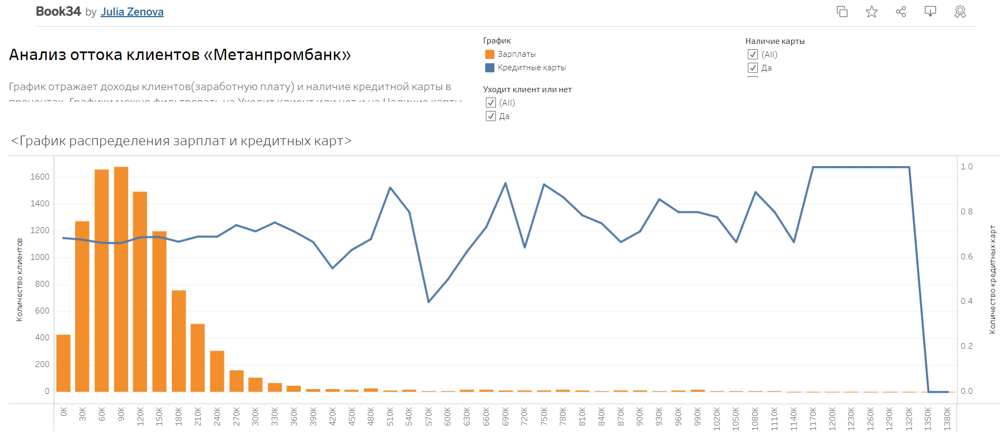

## Общий вывод и рекомендации

<u>Рекомендации по отдельным критериям</u>
- для клиентов с хорошим баллом(825-910 и 920-935) можно предложить хорошие кредитные условия на повторное взятие кредита(у них скорее всего уже был выплачен кредит)
- для групп 24-30, 30-37 возраста предложить рефинансирование ипотеки или автокредитования
- для групп 50-59 предложить пенсионные вклады с высоким процентом
- если у клиента в собственности более >2 объектов, то предложить инвестиции
- клиентам с большим балансом(>750000 если мы считаем, что это свободный баланс его средств) можно предложить валютные вклады 
- выплачивать более 2х продуктов, если это кредиты, довольно сложно, скорее всего клиенты пытаются найти условия лучше, тут нужно уточнить какие конкретно у них продукты и пересмотреть условия по ним
- клиенты с очень большими зарплатами(95000-140000, 160000-215000) нуждаются в дополнительных привилегиях - это может быть премиальным обслуживанием, дополнительные бонусы

<u>Рекомендации по сегментам</u>

_Клиенты у которых балл кредитного скорринга 825-910 и баланс > 750000 % оттока : 40.24_

Предложить рефинансирование кредитов и ипотеки, дополнительно можно заинтересовать инвестированием или выгодным курсов валют+валютным вкладом

_Мужчина с Ярославля с >=3 собственности % оттока : 36.87_

Можно предложить кредыты/ипотеки в залог собственности, дополнительно акцентировав внимание на акции, связанные с городом Ярославль(например в категории развлечения, т.к они привязаны к городу). Это может быть как кешбэк, так и просто скидки на покупки.

_Клиенты у которых балл кредитного скорринга 825-910 и зп 95000-140000 % оттока : 28.43_

Рекомендации могут быть схожи с первой группой. Можно предложить кредитные карты с хорошими условиями или депозитные вклады с большим %

<u>Подтвердились гипотезы</u>

H1: доходы между клиентами, которые ушли и которые остались различаются

H1: баланс между клиентами, которые ушли и которые остались различаются

H1: баллы кредитного скоринга между клиентами, которые ушли и которые остались различаются

H1: кол-во собственности между клиентами, которые ушли и которые остались различается

H1: Клиенты, которые из Ярославля и с других городов, отличаются отточностью

H1: Клиенты, которые из Рыбинска и с других городов, отличаются отточностью

H0: Клиенты, которые из Ростова и с других городов, не отличаются отточностью

H1: кол-во продуктов для клиентов, которые ушли и которые остались различается